In [1]:
import pandas as pd
import numpy as np
import os
from matplotlib.pyplot import *
from IPython.display import display, HTML
import glob
import scanpy as sc
import pandas as pd
import seaborn as sns

/nfs/software/stegle/users/acuomo/conda-envs/myscanpy/lib/python3.7/site-packages/anndata/_core/anndata.py:21: FutureWarning: pandas.core.index is deprecated and will be removed in a future version.  The public classes are available in the top-level namespace.
  from pandas.core.index import RangeIndex


In [2]:
myfolder = "/nfs/leia/research/stegle/dseaton/hipsci/singlecell_neuroseq/neuroseq_notebooks/"

In [3]:
file_df = pd.read_csv(myfolder+'/file_tracking.tsv', sep='\t', index_col=0)

file_df

,type,time_point,description,path
label,,,,
all_sample_h5,scanpy h5 file,all,Scanpy file with subsample of cells from all t...,/nfs/leia/research/stegle/dseaton/hipsci/singl...
D11_h5,scanpy h5 file,D11,scanpy file with all D11 cells,/nfs/leia/research/stegle/dseaton/hipsci/singl...
D30_h5,scanpy h5 file,D30,scanpy file with all D30 cells,/nfs/leia/research/stegle/dseaton/hipsci/singl...
D52_h5,scanpy h5 file,D52,scanpy file with all D52 cells,/nfs/leia/research/stegle/dseaton/hipsci/singl...
D11_cell_fractions,tsv,D11,"table of cell fractions for (donor_id,pool_id)...",/nfs/leia/research/stegle/dseaton/hipsci/singl...
D30_cell_fractions,tsv,D30,"table of cell fractions for (donor_id,pool_id)...",/nfs/leia/research/stegle/dseaton/hipsci/singl...
D52_cell_fractions,tsv,D52,"table of cell fractions for (donor_id,pool_id)...",/nfs/leia/research/stegle/dseaton/hipsci/singl...
diff_efficiency,tsv,D52,differentiation efficiency for each cell line,/nfs/leia/research/stegle/dseaton/hipsci/singl...
diff_trajectories,tsv,all,"all differentiation trajectories, restricted t...",/nfs/leia/research/stegle/dseaton/hipsci/singl...


In [4]:
file = file_df.loc['all_sample_h5','path']

In [5]:
file

'/nfs/leia/research/stegle/dseaton/hipsci/singlecell_neuroseq/data/data_processed/pool1_17_subsample_v1/pool1_17_subsample_v1.scanpy.w_metadata.w_celltype.scanpy.h5'

In [6]:
adatafull = sc.read(file)

Only considering the two last: ['.scanpy', '.h5'].
Only considering the two last: ['.scanpy', '.h5'].


In [7]:
adatafull.obs

,batch,donor_id,log1p_n_genes_by_counts,log1p_total_counts,log1p_total_counts_mito,n_genes_by_counts,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,pct_counts_in_top_50_genes,pct_counts_mito,sample_id,total_counts,total_counts_mito,cluster_id,time_point,pool_id,treatment,n_counts_all,celltype
index,,,,,,,,,,,,,,,,,,,,
TTCCCAGGTTCCATGA-1-0,0,HPSI0214i-eiwy_1,7.893572,9.321613,4.077538,2679,53.543307,63.842162,74.865784,37.687903,0.518969,5245STDY7352549,11176.0,58.0,0,D11,pool1,NONE,11176.0,FPP
AACCGCGAGGTCATCT-1-0,0,HPSI0114i-eipl_1,8.214194,9.801510,5.147494,3692,51.971207,61.666667,72.530454,37.308970,0.946844,5245STDY7352549,18060.0,171.0,1,D11,pool1,NONE,18060.0,P_FPP
TCACAAGTCTTATCTG-1-0,0,HPSI1113i-podx_1,8.319474,10.024244,5.318120,4102,51.511123,61.176106,71.900204,36.860764,0.899583,5245STDY7352549,22566.0,203.0,1,D11,pool1,NONE,22566.0,P_FPP
TACCTTACACGGTTTA-1-0,0,HPSI0614i-liqa_1,7.825245,9.297252,4.744932,2502,58.595397,67.717979,77.775740,42.917393,1.045200,5245STDY7352549,10907.0,114.0,0,D11,pool1,NONE,10907.0,FPP
CCTAGCTAGCGCCTTG-1-0,0,HPSI0114i-eipl_1,8.029433,9.451638,4.718499,3069,50.487115,60.402263,71.763042,36.635764,0.872093,5245STDY7352549,12728.0,111.0,1,D11,pool1,NONE,12728.0,P_FPP
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GGGCATCTCAACGCTA-1-150,150,HPSI1113i-qorq_1,8.315322,9.783182,6.086775,4085,37.074216,48.325062,63.489736,28.270923,2.475750,5245STDY8354286,17732.0,439.0,0,D52,pool17,ROT,17732.0,Sert
GGCCGATGTGTCCTCT-1-150,150,HPSI0115i-jotn_2,8.343554,9.910066,6.824374,4202,42.933784,53.519448,67.815806,34.454324,4.565098,5245STDY8354286,20131.0,919.0,0,D52,pool17,ROT,20131.0,Sert
GCGCAGTTCACGAAGG-1-150,150,HPSI0114i-vass_1,8.341649,10.012028,6.922644,4194,40.848735,51.157366,66.781805,33.316885,4.548717,5245STDY8354286,22292.0,1014.0,0,D52,pool17,ROT,22292.0,Sert


In [8]:
adatafull.var.head()

""
index
MIR1302-10
FAM138A
OR4F5
RP11-34P13.7
RP11-34P13.8


In [9]:
adatafull.obs['celltype_timepoint'] = (adatafull.obs.apply(lambda x: x['celltype']+'_'+x['time_point'], axis=1))

In [10]:
old_to_new = dict(
    DA_D52 = 'DA_D52',
    Astro_D30 = 'FPP_D30',
    DA_D30 = 'DA_D30',
    P_FPP_D11 = 'P_FPP_D11', 
    FPP_D52 = 'FPP_D52',
    Sert_D52 = 'Sert_D52',
    FPP_D11 = 'FPP_D11', 
    NB_D11 = 'NB_D11', 
    CHem_D30 = 'U_Neur1_D30', 
    P_FPP_D30 = 'P_FPP_D30',
    Epen1_D52 = 'Epen1_D52', 
    Astro_D52 = 'Astro_D52', 
    CHem_D52 = 'U_Neur1_D52', 
    Epen1_D30 = 'Epen1_D30', 
    P_FPP_D52 = 'P_FPP_D52',
    unknown_D30 = 'U_Neur2_D30', 
    Sert_D30 = 'Sert_D30', 
    Epen2_D52 = 'Epen2_D52', 
    unknown_D52 = 'U_Neur3_D52',
    P_Sert_D52 = 'P_Sert_D52'
)
adatafull.obs['celltype_timepoint_new'] = (
    adatafull.obs['celltype_timepoint']
    .map(old_to_new)
    .astype('category')
)

In [11]:
adatafull.obs['celltype_timepoint_new']

index
TTCCCAGGTTCCATGA-1-0        FPP_D11
AACCGCGAGGTCATCT-1-0      P_FPP_D11
TCACAAGTCTTATCTG-1-0      P_FPP_D11
TACCTTACACGGTTTA-1-0        FPP_D11
CCTAGCTAGCGCCTTG-1-0      P_FPP_D11
                            ...    
GGGCATCTCAACGCTA-1-150     Sert_D52
GGCCGATGTGTCCTCT-1-150     Sert_D52
GCGCAGTTCACGAAGG-1-150     Sert_D52
GCGCAGTAGGAATGGA-1-150     Sert_D52
GTCCTCATCTAACTTC-1-150       DA_D52
Name: celltype_timepoint_new, Length: 205416, dtype: category
Categories (20, object): [Astro_D52, DA_D30, DA_D52, Epen1_D30, ..., U_Neur1_D30, U_Neur1_D52, U_Neur2_D30, U_Neur3_D52]

In [12]:
old_to_new = dict(
    DA_D52 = 'DA',
    FPP_D30 = 'FPP',
    DA_D30 = 'DA',
    P_FPP_D11 = 'P_FPP', 
    FPP_D52 = 'FPP',
    Sert_D52 = 'Sert',
    FPP_D11 = 'FPP', 
    NB_D11 = 'NB', 
    U_Neur1_D30 = 'U_Neur1', 
    P_FPP_D30 = 'P_FPP',
    Epen1_D52 = 'Epen1', 
    Astro_D52 = 'Astro', 
    U_Neur1_D52 = 'U_Neur1', 
    Epen1_D30 = 'Epen1', 
    P_FPP_D52 = 'P_FPP',
    U_Neur2_D30 = 'U_Neur2', 
    Sert_D30 = 'Sert', 
    Epen2_D52 = 'Epen2', 
    U_Neur3_D52 = 'U_Neur3',
    P_Sert_D52 = 'P_Sert'
)
adatafull.obs['celltype_new'] = (
    adatafull.obs['celltype_timepoint_new']
    .map(old_to_new)
    .astype('category')
)

In [13]:
adatafull.obs['celltype_new']

index
TTCCCAGGTTCCATGA-1-0        FPP
AACCGCGAGGTCATCT-1-0      P_FPP
TCACAAGTCTTATCTG-1-0      P_FPP
TACCTTACACGGTTTA-1-0        FPP
CCTAGCTAGCGCCTTG-1-0      P_FPP
                          ...  
GGGCATCTCAACGCTA-1-150     Sert
GGCCGATGTGTCCTCT-1-150     Sert
GCGCAGTTCACGAAGG-1-150     Sert
GCGCAGTAGGAATGGA-1-150     Sert
GTCCTCATCTAACTTC-1-150       DA
Name: celltype_new, Length: 205416, dtype: category
Categories (12, object): [Astro, DA, Epen1, Epen2, ..., Sert, U_Neur1, U_Neur2, U_Neur3]

In [14]:
adatafull.obs.head()

,batch,donor_id,log1p_n_genes_by_counts,log1p_total_counts,log1p_total_counts_mito,n_genes_by_counts,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,pct_counts_in_top_50_genes,...,total_counts_mito,cluster_id,time_point,pool_id,treatment,n_counts_all,celltype,celltype_timepoint,celltype_timepoint_new,celltype_new
index,,,,,,,,,,,,,,,,,,,,,
TTCCCAGGTTCCATGA-1-0,0,HPSI0214i-eiwy_1,7.893572,9.321613,4.077538,2679,53.543307,63.842162,74.865784,37.687903,...,58.0,0,D11,pool1,NONE,11176.0,FPP,FPP_D11,FPP_D11,FPP
AACCGCGAGGTCATCT-1-0,0,HPSI0114i-eipl_1,8.214194,9.801510,5.147494,3692,51.971207,61.666667,72.530454,37.308970,...,171.0,1,D11,pool1,NONE,18060.0,P_FPP,P_FPP_D11,P_FPP_D11,P_FPP
TCACAAGTCTTATCTG-1-0,0,HPSI1113i-podx_1,8.319474,10.024244,5.318120,4102,51.511123,61.176106,71.900204,36.860764,...,203.0,1,D11,pool1,NONE,22566.0,P_FPP,P_FPP_D11,P_FPP_D11,P_FPP
TACCTTACACGGTTTA-1-0,0,HPSI0614i-liqa_1,7.825245,9.297252,4.744932,2502,58.595397,67.717979,77.775740,42.917393,...,114.0,0,D11,pool1,NONE,10907.0,FPP,FPP_D11,FPP_D11,FPP
CCTAGCTAGCGCCTTG-1-0,0,HPSI0114i-eipl_1,8.029433,9.451638,4.718499,3069,50.487115,60.402263,71.763042,36.635764,...,111.0,1,D11,pool1,NONE,12728.0,P_FPP,P_FPP_D11,P_FPP_D11,P_FPP


In [15]:
# adatafull.obs.to_csv("/hps/nobackup/stegle/users/acuomo/all_scripts/sc_neuroseq/scanpy/neuroseq_metadata_all.txt",sep = "\t")

In [16]:
adatafull.n_obs

205416

In [17]:
adatafull.obs.head()

,batch,donor_id,log1p_n_genes_by_counts,log1p_total_counts,log1p_total_counts_mito,n_genes_by_counts,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,pct_counts_in_top_50_genes,...,total_counts_mito,cluster_id,time_point,pool_id,treatment,n_counts_all,celltype,celltype_timepoint,celltype_timepoint_new,celltype_new
index,,,,,,,,,,,,,,,,,,,,,
TTCCCAGGTTCCATGA-1-0,0,HPSI0214i-eiwy_1,7.893572,9.321613,4.077538,2679,53.543307,63.842162,74.865784,37.687903,...,58.0,0,D11,pool1,NONE,11176.0,FPP,FPP_D11,FPP_D11,FPP
AACCGCGAGGTCATCT-1-0,0,HPSI0114i-eipl_1,8.214194,9.801510,5.147494,3692,51.971207,61.666667,72.530454,37.308970,...,171.0,1,D11,pool1,NONE,18060.0,P_FPP,P_FPP_D11,P_FPP_D11,P_FPP
TCACAAGTCTTATCTG-1-0,0,HPSI1113i-podx_1,8.319474,10.024244,5.318120,4102,51.511123,61.176106,71.900204,36.860764,...,203.0,1,D11,pool1,NONE,22566.0,P_FPP,P_FPP_D11,P_FPP_D11,P_FPP
TACCTTACACGGTTTA-1-0,0,HPSI0614i-liqa_1,7.825245,9.297252,4.744932,2502,58.595397,67.717979,77.775740,42.917393,...,114.0,0,D11,pool1,NONE,10907.0,FPP,FPP_D11,FPP_D11,FPP
CCTAGCTAGCGCCTTG-1-0,0,HPSI0114i-eipl_1,8.029433,9.451638,4.718499,3069,50.487115,60.402263,71.763042,36.635764,...,111.0,1,D11,pool1,NONE,12728.0,P_FPP,P_FPP_D11,P_FPP_D11,P_FPP


In [18]:
# subsample
fraction = 1
# fraction = 0.2
adata = sc.pp.subsample(adatafull, fraction, copy=True)

# selected_pools = ['pool10','pool11','pool12']
# adata = adatafull[adatafull.obs['pool_id'].isin(selected_pools),: ]

In [19]:
adata.n_obs

205416

In [20]:
adata.obs

,batch,donor_id,log1p_n_genes_by_counts,log1p_total_counts,log1p_total_counts_mito,n_genes_by_counts,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,pct_counts_in_top_50_genes,...,total_counts_mito,cluster_id,time_point,pool_id,treatment,n_counts_all,celltype,celltype_timepoint,celltype_timepoint_new,celltype_new
index,,,,,,,,,,,,,,,,,,,,,
ATCGAGTTCAAACGGG-1-60,60,HPSI0514i-fiaj_1,8.347827,9.487972,5.998937,4220,29.721949,38.366543,53.488901,22.880521,...,402.0,3,D52,pool5,NONE,13199.0,DA,DA_D52,DA_D52,DA
ACCAGTAAGACCTAGG-1-81,81,HPSI0115i-aoxv_1,8.043984,9.088625,5.181784,3114,34.745284,45.882752,60.747769,24.082232,...,177.0,1,D30,pool8,NONE,8853.0,Astro,Astro_D30,FPP_D30,FPP
GCTGCAGCAACCGCCA-1-46,46,HPSI0214i-poih_2,6.579251,7.176255,2.890372,719,44.070390,59.831676,83.244070,31.752104,...,17.0,0,D30,pool5,NONE,1307.0,DA,DA_D30,DA_D30,DA
AACTCCCTCGACAGCC-1-66,66,HPSI0414i-mita_1,7.980024,9.723763,5.087596,2921,58.686935,68.406248,78.795859,42.617751,...,161.0,1,D11,pool6,NONE,16709.0,P_FPP,P_FPP_D11,P_FPP_D11,P_FPP
CGTCCATGTAGGCTGA-1-53,53,HPSI0115i-paim_1,7.807103,9.137662,4.969813,2457,52.645730,61.916541,74.166487,38.137234,...,143.0,4,D52,pool1,NONE,9298.0,FPP,FPP_D52,FPP_D52,FPP
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTCTTAGTCTTCGGTC-1-123,123,HPSI0513i-sucd_3,6.546785,6.841616,4.499810,696,35.828877,46.951872,79.037433,25.133690,...,89.0,0,D11,pool11,NONE,935.0,FPP,FPP_D11,FPP_D11,FPP
TGAGGGAGTACCCAAT-1-79,79,HPSI0414i-mita_1,8.063378,9.085910,5.105946,3175,36.787858,46.777665,60.380564,26.446936,...,164.0,1,D30,pool6,NONE,8829.0,Astro,Astro_D30,FPP_D30,FPP
TCAGATGCATGACGGA-1-120,120,HPSI1113i-hayt_3,7.909122,9.296977,5.442418,2721,50.091709,60.409024,72.551357,37.133162,...,230.0,4,D52,pool9,ROT,10904.0,FPP,FPP_D52,FPP_D52,FPP


In [21]:
adata.n_vars

32738

In [22]:
adata.obs.to_csv("/hps/nobackup/stegle/users/acuomo/all_scripts/sc_neuroseq/coldata.csv")

In [23]:
# A = adata.X
# A.shape

In [24]:
# filename = "/hps/nobackup/stegle/users/acuomo/all_scripts/sc_neuroseq/scanpy/5pct_subsample.txt"

# A.maxprint = A.shape[0]
# with open(filename,"w") as file:
#     file.write(str(A)) 
#     file.close()

In [25]:
# # log quantification data and store as "raw"
# adata.raw = sc.pp.log1p(adata, copy=True)
# # adata.raw = adata
# # sc.pp.scale(adata)

In [26]:
# B = adata.raw.X
# B.shape

In [27]:
# filename = "/hps/nobackup/stegle/users/acuomo/all_scripts/sc_neuroseq/scanpy/5pct_subsample_raw.txt"

# B.maxprint = B.shape[0]
# with open(filename,"w") as file:
#     file.write(str(B)) 
#     file.close()

In [28]:
# results_file = "/hps/nobackup/stegle/users/acuomo/all_scripts/sc_neuroseq/scanpy/5pct_subsample.h5ad"
# adata.write(results_file)
# # adata = sc.read(results_file)

In [29]:
# try to store celltype as categorical with different ordering
celltype_ordering = ["P_FPP","FPP","NB","CHem","Sert","P_Sert","DA", "Astro","Epen1","Epen2","unknown"]
# celltype_ordering = ['P_FPP','FPP','NB','CHem','DA','Sert','Astro','Epen1','P_Sert','Epen2','unknown','other']

cat_type = pd.CategoricalDtype(categories=celltype_ordering,ordered=True)

adata.obs['celltype'] = adata.obs['celltype'].astype(cat_type)

In [30]:
adata.obs['celltype_timepoint'] = (adata.obs.apply(lambda x: x['celltype']+'_'+x['time_point'], axis=1))

In [31]:
old_to_new = dict(
    DA_D52 = 'DA_D52',
    Astro_D30 = 'FPP_D30',
    DA_D30 = 'DA_D30',
    P_FPP_D11 = 'P_FPP_D11', 
    FPP_D52 = 'FPP_D52',
    Sert_D52 = 'Sert_D52',
    FPP_D11 = 'FPP_D11', 
    NB_D11 = 'NB_D11', 
    CHem_D30 = 'U_Neur1_D30', 
    P_FPP_D30 = 'P_FPP_D30',
    Epen1_D52 = 'Epen1_D52', 
    Astro_D52 = 'Astro_D52', 
    CHem_D52 = 'U_Neur1_D52', 
    Epen1_D30 = 'Epen1_D30', 
    P_FPP_D52 = 'P_FPP_D52',
    unknown_D30 = 'U_Neur2_D30', 
    Sert_D30 = 'Sert_D30', 
    Epen2_D52 = 'Epen2_D52', 
    unknown_D52 = 'U_Neur3_D52',
    P_Sert_D52 = 'P_Sert_D52'
)
adata.obs['celltype_timepoint_new'] = (
    adata.obs['celltype_timepoint']
    .map(old_to_new)
    .astype('category')
)

In [24]:
adata.obs['celltype_timepoint_new']

index
ATCGAGTTCAAACGGG-1-60          DA_D52
ACCAGTAAGACCTAGG-1-81         FPP_D30
GCTGCAGCAACCGCCA-1-46          DA_D30
AACTCCCTCGACAGCC-1-66       P_FPP_D11
CGTCCATGTAGGCTGA-1-53         FPP_D52
                             ...     
TTCTTAGTCTTCGGTC-1-123        FPP_D11
TGAGGGAGTACCCAAT-1-79         FPP_D30
TCAGATGCATGACGGA-1-120        FPP_D52
ACTTTCAAGACCGGAT-1-26         FPP_D30
TACACGAAGTGTCCCG-1-145    U_Neur1_D52
Name: celltype_timepoint_new, Length: 205416, dtype: category
Categories (20, object): [Astro_D52, DA_D30, DA_D52, Epen1_D30, ..., U_Neur1_D30, U_Neur1_D52, U_Neur2_D30, U_Neur3_D52]

In [25]:
# try to store celltype as categorical with different ordering
ordering = ["P_FPP","FPP","NB","Astro", "Epen1","Epen2","Sert","P_Sert","DA","U_Neur1","U_Neur2","U_Neur3"]
ordering = [x+'_'+y for x in ordering for y in ['D11','D30','D52']]


cat_type = pd.CategoricalDtype(categories=ordering,ordered=True)

adata.obs['celltype_timepoint_new'] = adata.obs['celltype_timepoint_new'].astype(cat_type)

... storing 'celltype_timepoint' as categorical


<Figure size 432x288 with 0 Axes>

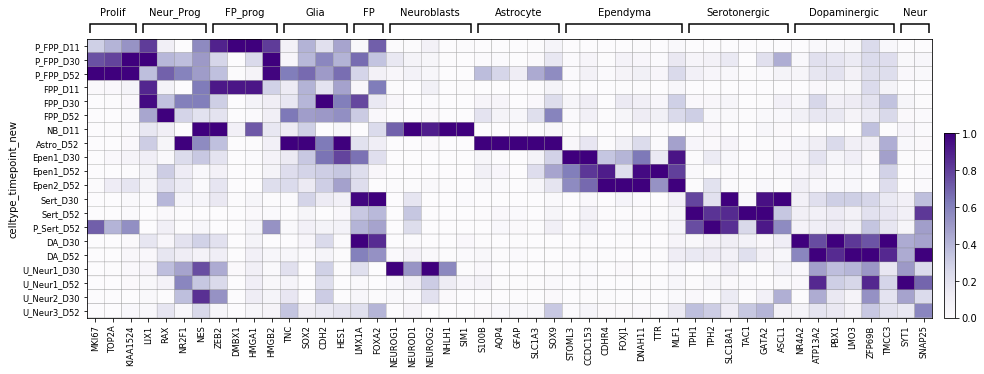

<Figure size 432x288 with 0 Axes>

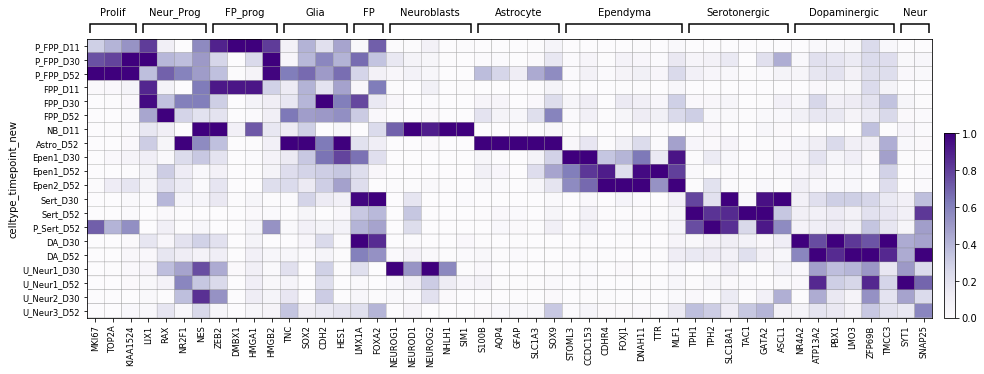

<Figure size 432x288 with 0 Axes>

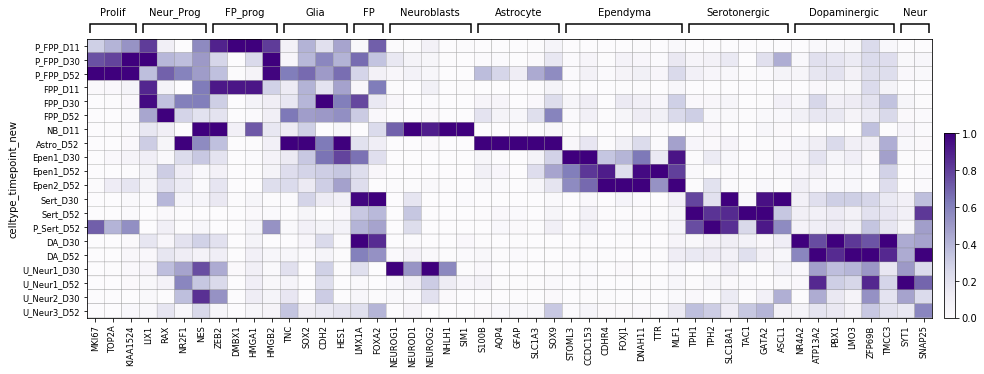

In [26]:
Proliferating = ['MKI67', 'TOP2A', 'KIAA1524']
Neural_Prog = ['LIX1', 'RAX', 'NR2F1', 'NES',]
FP_prog = ['ZEB2', 'DMBX1','HMGA1', 'HMGB2']
Glia = ['TNC', 'SOX2', 'CDH2', 'HES1']
FP = ['LMX1A', 'FOXA2']
Astrocytes = ['S100B', 'AQP4', 'GFAP', 'SLC1A3','SOX9']
Ependyma = ['STOML3','CCDC153','CDHR4','FOXJ1','DNAH11',  'TTR','MLF1']
Serotonergic = ['TPH1', 'TPH2', 'SLC18A1', 'TAC1', 'GATA2','ASCL1']
Dopaminergic = ['NR4A2', 'ATP13A2', 'PBX1', 'LMO3',  'ZFP69B', 'TMCC3']
Neuron = ['SYT1', 'SNAP25']
Neuroblasts = ['NEUROG1', 'NEUROD1', 'NEUROG2', 'NHLH1', 'SIM1']

var_group_positions=[(0,2), (3,6), (7, 10),(11,14),(15,16),(17,21),(22,26),(27,33),(34,39),(40,45),(46,47)]
var_group_labels=['Prolif','Neur_Prog', 'FP_prog','Glia','FP','Neuroblasts',
                  'Astrocyte','Ependyma','Serotonergic','Dopaminergic','Neur']

gene_list = Proliferating+Neural_Prog+FP_prog+Glia+FP+Neuroblasts+Astrocytes+Ependyma+Serotonergic+Dopaminergic+Neuron    
# gene_list = ['MKI67', 'TOP2A', 'KIAA1524', 'LIX1', 'RAX', 'NR2F1', 'NES', 'ZEB2', 'DMBX1','HMGA1', 'HMGB2', 'TNC', 'SOX2', 'CDH2', 
#        'HES1', 'LMX1A', 'FOXA2','S100B', 'AQP4', 'GFAP', 'SLC1A3','SOX9', 'STOML3','CCDC153','CDHR4','FOXJ1','DNAH11',
#        'TTR','MLF1', 'TPH1', 'TPH2', 'SLC18A1', 'TAC1', 'GATA2','ASCL1','NR4A2', 'ATP13A2', 'PBX1', 'LMO3', 
#        'ZFP69B', 'TMCC3', 'SYT1', 'SNAP25']

# var_group_positions=[(0,1), (2,5), (6, 8),(9,12),(13,16),(17,21),(22,28),(29,34),(35,40),(41,42)]
# var_group_labels=['FP','FP_prog','Prolif','Neural_Prog', 'Glia',
#                   'Astrocyte','Ependyma','Serotonergic','Dopaminergic','Neuron']

# gene_list = FP+FP_prog+Proliferating+Neural_Prog+Glia+Astrocytes+Ependyma+Serotonergic+Dopaminergic+Neuron      


for time_point in ['D11','D30','D52']:
    figure()
    sc.pl.matrixplot(adata, var_names=gene_list,
                     groupby='celltype_timepoint_new', standard_scale='var', cmap='Purples',
                    var_group_positions=var_group_positions, var_group_labels = var_group_labels,
                     var_group_rotation=0)

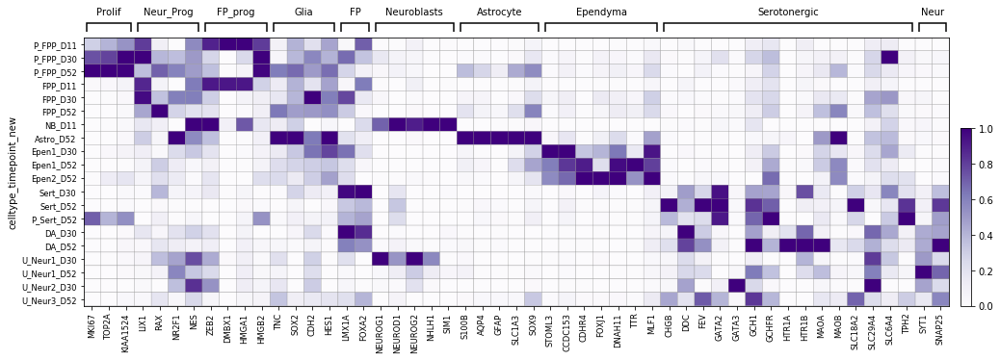

GridSpec(2, 3, height_ratios=[0.5, 10], width_ratios=[16.32, 0, 0.2])

In [39]:
Proliferating = ['MKI67', 'TOP2A', 'KIAA1524']
Neural_Prog = ['LIX1', 'RAX', 'NR2F1', 'NES']
FP_prog = ['ZEB2', 'DMBX1','HMGA1', 'HMGB2']
Glia = ['TNC', 'SOX2', 'CDH2', 'HES1']
FP = ['LMX1A', 'FOXA2']
Astrocytes = ['S100B', 'AQP4', 'GFAP', 'SLC1A3','SOX9']
Ependyma = ['STOML3','CCDC153','CDHR4','FOXJ1','DNAH11','TTR','MLF1']
Serotonergic = ['CHGB', 'DDC','FEV','GATA2', 'GATA3', 'GCH1', 'GCHFR', 'HTR1A','HTR1B','MAOA','MAOB','SLC18A2','SLC29A4','SLC6A4','TPH2']
Neuron = ['SYT1', 'SNAP25']
Neuroblasts = ['NEUROG1', 'NEUROD1', 'NEUROG2', 'NHLH1', 'SIM1']

var_group_positions=[(0,2), (3,6), (7, 10),(11,14),(15,16),(17,21),(22,26),(27,33),(34,48),(49,50)]
var_group_labels=['Prolif','Neur_Prog', 'FP_prog','Glia','FP','Neuroblasts',
                  'Astrocyte','Ependyma','Serotonergic','Neur']

gene_list = Proliferating+Neural_Prog+FP_prog+Glia+FP+Neuroblasts+Astrocytes+Ependyma+Serotonergic+Neuron          


sc.pl.matrixplot(adata, var_names=gene_list,
                    groupby='celltype_timepoint_new', standard_scale='var', cmap='Purples',
                    var_group_positions=var_group_positions, var_group_labels = var_group_labels,
                     var_group_rotation=0)

In [40]:
adata.obs['celltype_timepoint_new_treatment'] = (adata.obs.apply(lambda x: x['celltype_timepoint_new']+'_'+x['treatment'], axis=1))

In [41]:
adata.obs

,batch,donor_id,log1p_n_genes_by_counts,log1p_total_counts,log1p_total_counts_mito,n_genes_by_counts,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,pct_counts_in_top_50_genes,...,cluster_id,time_point,pool_id,treatment,n_counts_all,celltype,celltype_timepoint,celltype_timepoint_new,celltype_new,celltype_timepoint_new_treatment
index,,,,,,,,,,,,,,,,,,,,,
ATCGAGTTCAAACGGG-1-60,60,HPSI0514i-fiaj_1,8.347827,9.487972,5.998937,4220,29.721949,38.366543,53.488901,22.880521,...,1,D52,pool5,NONE,13199.0,DA,DA_D52,DA_D52,DA,DA_D52_NONE
ACCAGTAAGACCTAGG-1-81,81,HPSI0115i-aoxv_1,8.043984,9.088625,5.181784,3114,34.745284,45.882752,60.747769,24.082232,...,0,D30,pool8,NONE,8853.0,Astro,Astro_D30,FPP_D30,FPP,FPP_D30_NONE
GCTGCAGCAACCGCCA-1-46,46,HPSI0214i-poih_2,6.579251,7.176255,2.890372,719,44.070390,59.831676,83.244070,31.752104,...,1,D30,pool5,NONE,1307.0,DA,DA_D30,DA_D30,DA,DA_D30_NONE
AACTCCCTCGACAGCC-1-66,66,HPSI0414i-mita_1,7.980024,9.723763,5.087596,2921,58.686935,68.406248,78.795859,42.617751,...,5,D11,pool6,NONE,16709.0,P_FPP,P_FPP_D11,P_FPP_D11,P_FPP,P_FPP_D11_NONE
CGTCCATGTAGGCTGA-1-53,53,HPSI0115i-paim_1,7.807103,9.137662,4.969813,2457,52.645730,61.916541,74.166487,38.137234,...,4,D52,pool1,NONE,9298.0,FPP,FPP_D52,FPP_D52,FPP,FPP_D52_NONE
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTCTTAGTCTTCGGTC-1-123,123,HPSI0513i-sucd_3,6.546785,6.841616,4.499810,696,35.828877,46.951872,79.037433,25.133690,...,7,D11,pool11,NONE,935.0,FPP,FPP_D11,FPP_D11,FPP,FPP_D11_NONE
TGAGGGAGTACCCAAT-1-79,79,HPSI0414i-mita_1,8.063378,9.085910,5.105946,3175,36.787858,46.777665,60.380564,26.446936,...,7,D30,pool6,NONE,8829.0,Astro,Astro_D30,FPP_D30,FPP,FPP_D30_NONE
TCAGATGCATGACGGA-1-120,120,HPSI1113i-hayt_3,7.909122,9.296977,5.442418,2721,50.091709,60.409024,72.551357,37.133162,...,4,D52,pool9,ROT,10904.0,FPP,FPP_D52,FPP_D52,FPP,FPP_D52_ROT


In [42]:
ordering = ["P_FPP","FPP","NB","Astro", "Epen1","Epen2","Sert","P_Sert","DA","U_Neur1","U_Neur2","U_Neur3"]
ordering = [x+'_'+y for x in ordering for y in ['D11','D30','D52']]
ordering = [x+'_'+y for x in ordering for y in ['NONE','ROT']]

In [43]:
cat_type = pd.CategoricalDtype(categories=ordering,ordered=True)

adata.obs['celltype_timepoint_new_treatment'] = adata.obs['celltype_timepoint_new_treatment'].astype(cat_type)

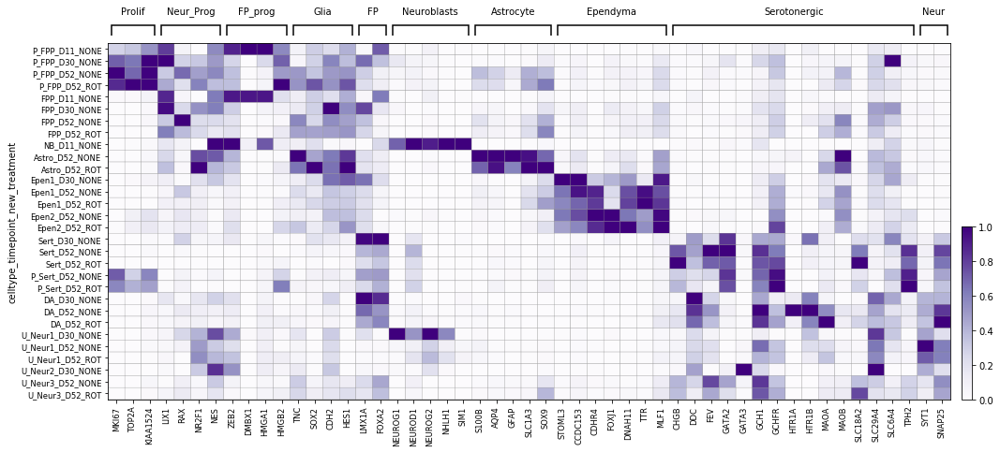

GridSpec(2, 3, height_ratios=[0.5, 10], width_ratios=[16.32, 0, 0.2])

In [44]:
sc.pl.matrixplot(adata, var_names=gene_list,
                     groupby='celltype_timepoint_new_treatment', standard_scale='var', cmap='Purples',
                    var_group_positions=var_group_positions, var_group_labels = var_group_labels,
                     var_group_rotation=0)

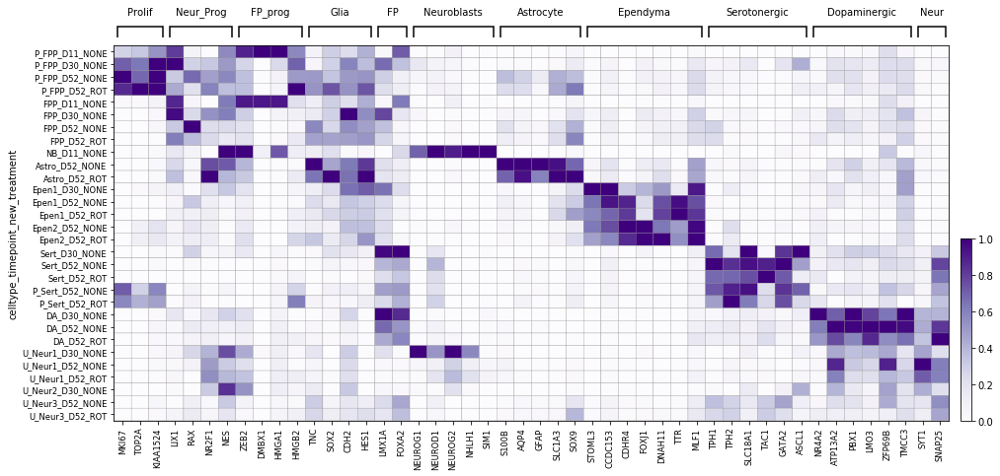

GridSpec(2, 3, height_ratios=[0.5, 10], width_ratios=[15.36, 0, 0.2])

In [31]:
sc.pl.matrixplot(adata, var_names=gene_list,
                     groupby='celltype_timepoint_new_treatment', standard_scale='var', cmap='Purples',
                    var_group_positions=var_group_positions, var_group_labels = var_group_labels,
                     var_group_rotation=0)

In [39]:
gene_list = ['SLC18A1','PBX1','EN1','KLHL1','TMCC3','PITX3','TH','GRIK3','CHL1', 'CAMK2N1','SLC10A4','KCNIP4','PRKCA','ARG2','ERC2','FGF13','IGF1',
       'NTSR1','EPHA5','PTPN5','CHRNA4','GRIA3','NR4A2', 'BNC2','SLC18A2', 'CALB1', 'ASB4', 'SNCA','CDK14','SLC6A3', 'VGF', 'TUB', 'PRRT4', 'CPEB3', 'KLHL13', 
       'KCNJ6', 'NETO2', 'GRP', 'SCG2','GDAP1', 'CADPS2', 'TMEM255A', 'PRICKLE2', 
      'LGI1','CHMP3', 'DKK3', 'LMO3', 'SOX6','AMER3','ALDH1A1', 'PRL', 'DRD2', 'ABCC8', 'RET']

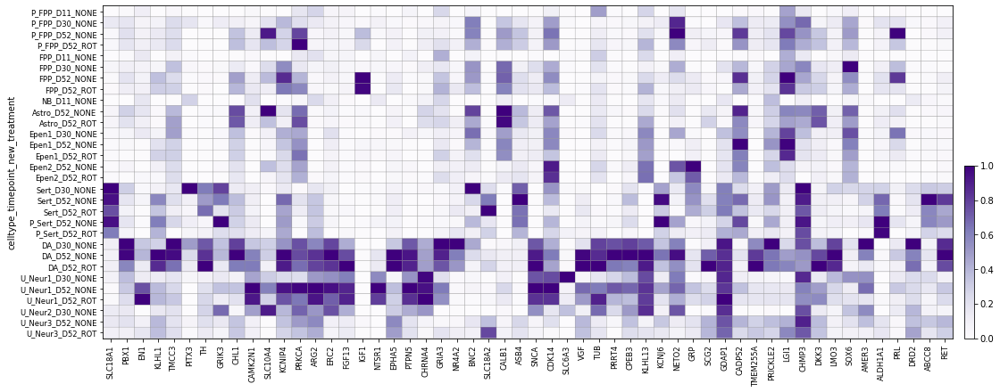

GridSpec(2, 3, height_ratios=[0, 10.5], width_ratios=[17.28, 0, 0.2])

In [40]:
sc.pl.matrixplot(adata, var_names=gene_list,
                     groupby='celltype_timepoint_new_treatment', standard_scale='var', cmap='Purples',
                     var_group_rotation=0)

In [41]:
# Dopaminergic neurons
# La Manno et al., 2016 + Arenas et al, 2015
hDA_All_LaManno_Arenas=['ABCC8','ACOT7','ALDH1A1','AMER3','ARG2','ASB4','BNC2','CADPS2','CALB1','CALB2','CAMK2N1',
                        'CCK','CDK14','CDKN1C','CHL1',
#                         'CHMA6','CHMB3',
                        'CHRNA4','CPEB3','CXCR4','DCC','DKK3','DRD2',
                        'EBF2','EN1','EN2','EPHA5','ERC2','FGF13','FOXA1','FOXA2','GDAP1','GFRA1','GRIA3','GRIK3',
                        'GRP','ICA1L','IGF1','KCNIP4','KCNJ6','KLHL1','KLHL13','LGI1','LMO3','LMX1A','LMX1B',
                        'LRRC3B','LRRTM2','LSAMP','LY6H','NETO2','NR4A2','NTSR1','OTX2','PBX1','PRICKLE2','PRKCA',
                        'PRL','PRRT4','PITX3','PTPN5','PTPRO','RET','SCG2','SLC10A4','SLC18A1','SLC18A2','SLC18A3',
                        'SLC6A3','SNCA','SOX6','TH','TMCC3','TMEFF2','TMEM255A','TUB','VGF']

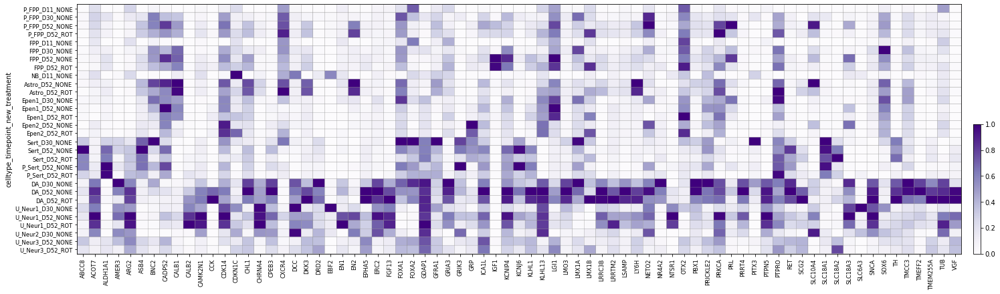

GridSpec(2, 3, height_ratios=[0, 10.5], width_ratios=[24.0, 0, 0.2])

In [42]:
sc.pl.matrixplot(adata, var_names=hDA_All_LaManno_Arenas,
                     groupby='celltype_timepoint_new_treatment', standard_scale='var', cmap='Purples',                    
                     var_group_rotation=0)

In [43]:
# Dopaminergic neurons
# La Manno et al., 2016
hDA0_LaManno = ['ACOT7', 'ARG2','CALB2','CAMK2N1','CHL1','CHRNA4','EBF2', 'EN1','EN2','EPHA5','ERC2','FGF13','FOXA2',
                'GFRA1','GRIA3','GRIK3','ICA1L','IGF1','KCNIP4','KLHL1','LRRC3B','LSAMP','LY6H','NR4A2','NTSR1',
                'PBX1','PRKCA',
                'PITX3',
                'PTPN5','PTPRO','SLC10A4','SLC18A1','TH','TMCC3','TMEFF2']

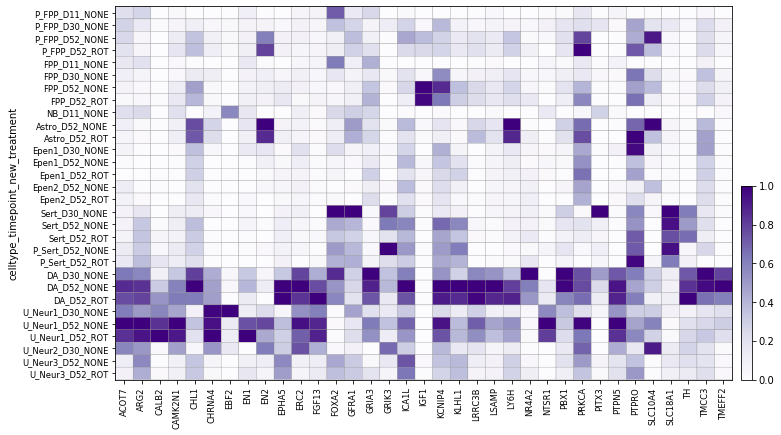

GridSpec(2, 3, height_ratios=[0, 10.5], width_ratios=[11.200000000000001, 0, 0.2])

In [44]:
sc.pl.matrixplot(adata, var_names=hDA0_LaManno,
                     groupby='celltype_timepoint_new_treatment', standard_scale='var', cmap='Purples',                    
                     var_group_rotation=0)

In [45]:
hDA1_LaManno = ['ARG2','ASB4','BNC2','CADPS2','CALB1','CAMK2N1','CDK14','CHL1','CHRNA4','CPEB3','DCC','EN1','EN2',
                'EPHA5','ERC2','FGF13','FOXA2','GDAP1','GFRA1','GRIA3','GRIK3','GRP','IGF1','KCNIP4','KCNJ6','KLHL1',
                'KLHL13','LRRC3B','LRRTM2','LSAMP','NETO2','NR4A2','NTSR1','PBX1','PRICKLE2','PRKCA','PRRT4','PITX3',
                'PTPN5','SCG2','SLC10A4','SLC18A1','SLC18A2','SLC6A3','SNCA','TH','TMCC3','TMEFF2','TMEM255A','TUB',
                'VGF']

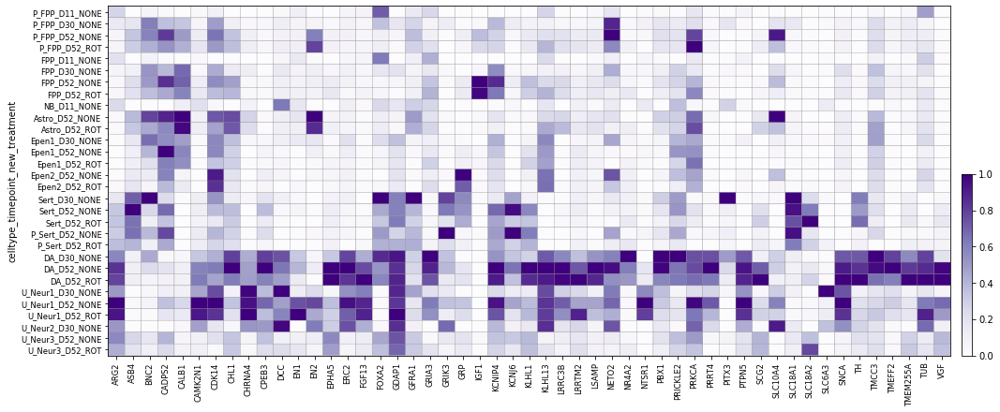

GridSpec(2, 3, height_ratios=[0, 10.5], width_ratios=[16.32, 0, 0.2])

In [46]:
sc.pl.matrixplot(adata, var_names=hDA1_LaManno,
                     groupby='celltype_timepoint_new_treatment', standard_scale='var', cmap='Purples',                    
                     var_group_rotation=0)

In [47]:
hDA2_LaManno = ['ABCC8','ACOT7','ALDH1A1','AMER3','ARG2','ASB4','BNC2','CALB1','CALB2','CAMK2N1','CDK14','CHL1',
#                 'CHMA6','CHMB3',
                'CHRNA4','CPEB3','DCC','DKK3','DRD2','EN1','EN2','EPHA5','ERC2','FGF13','GFRA1','GRIA3','GRIK3',
                'GRP','IGF1','KCNIP4','KCNJ6','KLHL1','KLHL13','LGI1','LMO3','LRRC3B','LRRTM2','LY6H','NETO2','NR4A2',
                'NTSR1','PBX1','PRKCA','PRL','PRRT4','PITX3','PTPN5','RET','SLC10A4','SLC18A1','SLC18A2','SLC6A3',
                'SNCA','SOX6','TH','TMCC3','TUB','VGF']

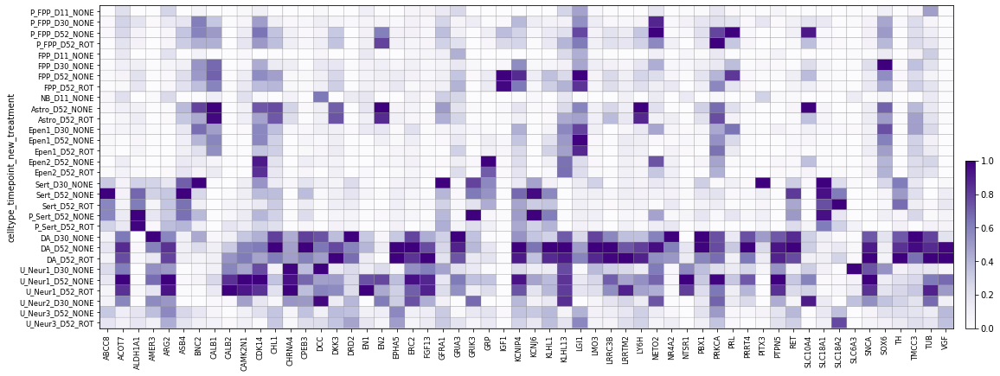

GridSpec(2, 3, height_ratios=[0, 10.5], width_ratios=[17.92, 0, 0.2])

In [48]:
sc.pl.matrixplot(adata, var_names=hDA2_LaManno,
                     groupby='celltype_timepoint_new_treatment', standard_scale='var', cmap='Purples',                    
                     var_group_rotation=0)

In [49]:
hDA_All_LaManno=['ABCC8','ACOT7','ALDH1A1','AMER3','ARG2','ASB4','BNC2','CADPS2','CALB1','CALB2','CAMK2N1','CDK14',
                 'CHL1',
#                  'CHMA6','CHMB3',
                 'CHRNA4','CPEB3','DCC','DKK3','DRD2','EBF2','EN1','EN2','EPHA5','ERC2','FGF13','FOXA2','GDAP1',
                 'GFRA1','GRIA3','GRIK3','GRP','ICA1L','IGF1','KCNIP4','KCNJ6','KLHL1','KLHL13','LGI1','LMO3',
                 'LRRC3B','LRRTM2','LSAMP','LY6H','NETO2','NR4A2','NTSR1','PBX1','PRICKLE2','PRKCA','PRL','PRRT4',
                 'PITX3','PTPN5','PTPRO','RET','SCG2','SLC10A4','SLC18A1','SLC18A2','SLC6A3','SNCA','SOX6','TH',
                 'TMCC3','TMEFF2','TMEM255A','TUB','VGF']

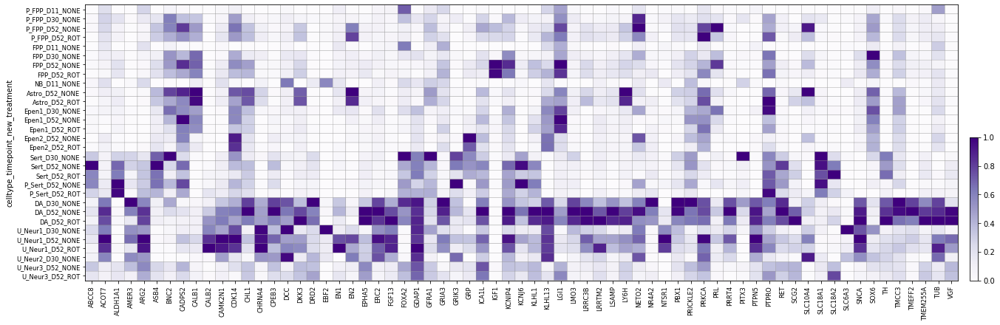

GridSpec(2, 3, height_ratios=[0, 10.5], width_ratios=[21.44, 0, 0.2])

In [50]:
sc.pl.matrixplot(adata, var_names=hDA_All_LaManno,
                     groupby='celltype_timepoint_new_treatment', standard_scale='var', cmap='Purples',                    
                     var_group_rotation=0)

In [51]:
# Arenas et al., 2015
DA_neurons_Arenas = ['ALDH1A1','CCK','CDKN1C','CXCR4','DDC','EN1','EN2','FOXA1','FOXA2','FOXA2','KCNJ6','LMX1A',
                     'LMX1B','NR4A2','OTX2','PITX3','RET','SLC18A2','SLC18A3','SOX6','TH']

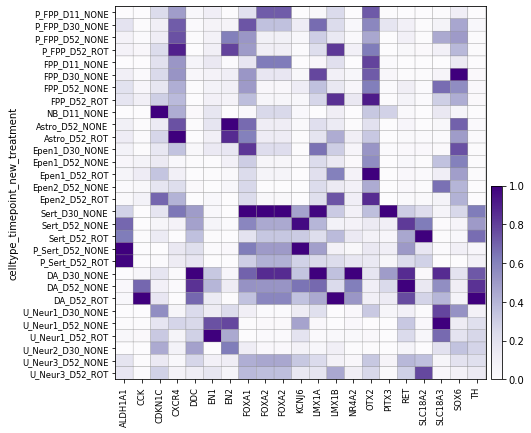

GridSpec(2, 3, height_ratios=[0, 10.5], width_ratios=[6.72, 0, 0.2])

In [52]:
sc.pl.matrixplot(adata, var_names=DA_neurons_Arenas,
                     groupby='celltype_timepoint_new_treatment', standard_scale='var', cmap='Purples',                    
                     var_group_rotation=0)

In [53]:
# Serotonergic neurons
# La Manno et al., 2016
hSert_LaManno =['CHGB','DDC','FEV','GATA3','GCH1','GCHFR','HTR1A','MAOA','SLC18A2','SLC6A4','TPH2']

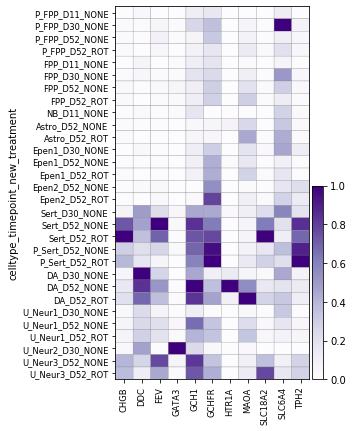

GridSpec(2, 3, height_ratios=[0, 10.5], width_ratios=[3.52, 0, 0.2])

In [54]:
sc.pl.matrixplot(adata, var_names=hSert_LaManno,
                     groupby='celltype_timepoint_new_treatment', standard_scale='var', cmap='Purples',                    
                     var_group_rotation=0)

In [61]:
# TPH2, serotonin (SLC6A4), GATA3, GATA2, FEV, LMX1B, SERT (SLC6A4), AADC (DDC) and VMAT2 (SLC18A2)
# from L. Cao et al, 2017
Sert=['TPH2', 'GATA3', 'GATA2','FEV', 'LMX1B','DDC','SLC6A4','SLC18A2']

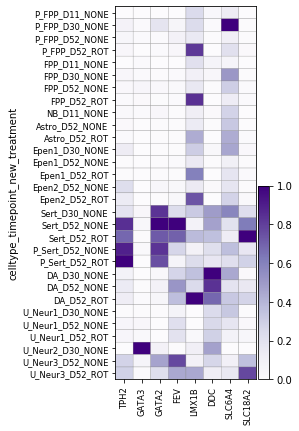

GridSpec(2, 3, height_ratios=[0, 10.5], width_ratios=[2.56, 0, 0.2])

In [62]:
sc.pl.matrixplot(adata, var_names=Sert,
                     groupby='celltype_timepoint_new_treatment', standard_scale='var', cmap='Purples',                    
                     var_group_rotation=0)

In [47]:
Sert=['SLC6A4', 'SLC18A2', 'FEV','GAD2', 'GAD1','SLC17A3','HTR1A','PAX5','CRHR2','NR2F2','LMX1B', 'MET']

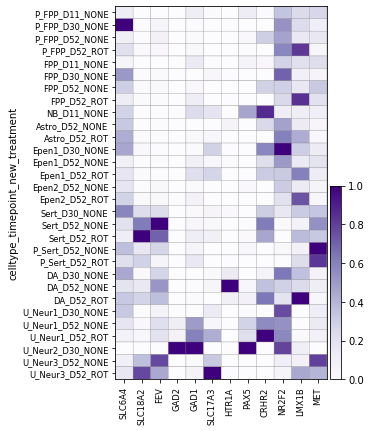

GridSpec(2, 3, height_ratios=[0, 10.5], width_ratios=[3.84, 0, 0.2])

In [54]:
sc.pl.matrixplot(adata, var_names=Sert,
                     groupby='celltype_timepoint_new_treatment', standard_scale='var', cmap='Purples',                    
                     var_group_rotation=0)

In [57]:
Sert=['CHGB', 'DDC','FEV', 'GATA3', 'GCH1', 'GCHFR', 'HTR1A','MAOA','SLC18A2','SLC6A4','TPH2', 'GATA2', 
#       'PET1',
      'SLC29A4','MAOB','HTR1B']

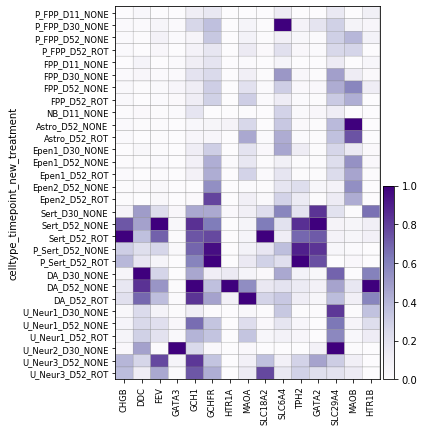

GridSpec(2, 3, height_ratios=[0, 10.5], width_ratios=[4.8, 0, 0.2])

In [58]:
sc.pl.matrixplot(adata, var_names=Sert,
                     groupby='celltype_timepoint_new_treatment', standard_scale='var', cmap='Purples',                    
                     var_group_rotation=0)

In [68]:
# Cortical Hem
# Loo et al., 2019 (scRNA in mouse)
Cortical_hem=['DKK3','EOMES','RELN','LHX1','LHX5',
#               'TRP73',
              'TP73', # human ortholog
              'CALB2','EBF3','SAMD3','SOX2']

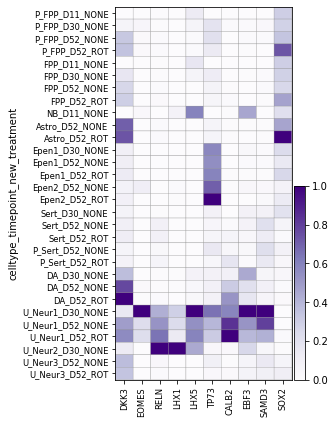

GridSpec(2, 3, height_ratios=[0, 10.5], width_ratios=[3.2, 0, 0.2])

In [69]:
sc.pl.matrixplot(adata, var_names=Cortical_hem,
                     groupby='celltype_timepoint_new_treatment', standard_scale='var', cmap='Purples',                    
                     var_group_rotation=0)

In [49]:
fig_format = 'png'
# fig_format = 'pdf'
sc.set_figure_params(dpi_save=200,format=fig_format)
#rcParams['figure.figsize'] = 5,4
rcParams['figure.figsize'] = 5,4

plotting_fcn = sc.pl.umap

In [41]:
adata.obs

,batch,donor_id,log1p_n_genes_by_counts,log1p_total_counts,log1p_total_counts_mito,n_genes_by_counts,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,pct_counts_in_top_50_genes,...,cluster_id,time_point,pool_id,treatment,n_counts_all,celltype,celltype_timepoint,celltype_timepoint_new,celltype_new,celltype_timepoint_new_treatment
index,,,,,,,,,,,,,,,,,,,,,
ATCGAGTTCAAACGGG-1-60,60,HPSI0514i-fiaj_1,8.347827,9.487972,5.998937,4220,29.721949,38.366543,53.488901,22.880521,...,1,D52,pool5,NONE,13199.0,DA,DA_D52,DA_D52,DA,DA_D52_NONE
ACCAGTAAGACCTAGG-1-81,81,HPSI0115i-aoxv_1,8.043984,9.088625,5.181784,3114,34.745284,45.882752,60.747769,24.082232,...,0,D30,pool8,NONE,8853.0,Astro,Astro_D30,FPP_D30,FPP,FPP_D30_NONE
GCTGCAGCAACCGCCA-1-46,46,HPSI0214i-poih_2,6.579251,7.176255,2.890372,719,44.070390,59.831676,83.244070,31.752104,...,1,D30,pool5,NONE,1307.0,DA,DA_D30,DA_D30,DA,DA_D30_NONE
AACTCCCTCGACAGCC-1-66,66,HPSI0414i-mita_1,7.980024,9.723763,5.087596,2921,58.686935,68.406248,78.795859,42.617751,...,5,D11,pool6,NONE,16709.0,P_FPP,P_FPP_D11,P_FPP_D11,P_FPP,P_FPP_D11_NONE
CGTCCATGTAGGCTGA-1-53,53,HPSI0115i-paim_1,7.807103,9.137662,4.969813,2457,52.645730,61.916541,74.166487,38.137234,...,4,D52,pool1,NONE,9298.0,FPP,FPP_D52,FPP_D52,FPP,FPP_D52_NONE
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTCTTAGTCTTCGGTC-1-123,123,HPSI0513i-sucd_3,6.546785,6.841616,4.499810,696,35.828877,46.951872,79.037433,25.133690,...,7,D11,pool11,NONE,935.0,FPP,FPP_D11,FPP_D11,FPP,FPP_D11_NONE
TGAGGGAGTACCCAAT-1-79,79,HPSI0414i-mita_1,8.063378,9.085910,5.105946,3175,36.787858,46.777665,60.380564,26.446936,...,7,D30,pool6,NONE,8829.0,Astro,Astro_D30,FPP_D30,FPP,FPP_D30_NONE
TCAGATGCATGACGGA-1-120,120,HPSI1113i-hayt_3,7.909122,9.296977,5.442418,2721,50.091709,60.409024,72.551357,37.133162,...,4,D52,pool9,ROT,10904.0,FPP,FPP_D52,FPP_D52,FPP,FPP_D52_ROT


In [42]:
old_to_new = dict(
    DA_D52 = 'DA',
    FPP_D30 = 'FPP',
    DA_D30 = 'DA',
    P_FPP_D11 = 'P_FPP', 
    FPP_D52 = 'FPP',
    Sert_D52 = 'Sert',
    FPP_D11 = 'FPP', 
    NB_D11 = 'NB', 
    U_Neur1_D30 = 'U_Neur1', 
    P_FPP_D30 = 'P_FPP',
    Epen1_D52 = 'Epen1', 
    Astro_D52 = 'Astro', 
    U_Neur1_D52 = 'U_Neur1', 
    Epen1_D30 = 'Epen1', 
    P_FPP_D52 = 'P_FPP',
    U_Neur2_D30 = 'U_Neur2', 
    Sert_D30 = 'Sert', 
    Epen2_D52 = 'Epen2', 
    U_Neur3_D52 = 'U_Neur3',
    P_Sert_D52 = 'P_Sert'
)
adata.obs['celltype_new'] = (
    adata.obs['celltype_timepoint_new']
    .map(old_to_new)
    .astype('category')
)

In [43]:
adata.obs

,batch,donor_id,log1p_n_genes_by_counts,log1p_total_counts,log1p_total_counts_mito,n_genes_by_counts,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,pct_counts_in_top_50_genes,...,cluster_id,time_point,pool_id,treatment,n_counts_all,celltype,celltype_timepoint,celltype_timepoint_new,celltype_new,celltype_timepoint_new_treatment
index,,,,,,,,,,,,,,,,,,,,,
ATCGAGTTCAAACGGG-1-60,60,HPSI0514i-fiaj_1,8.347827,9.487972,5.998937,4220,29.721949,38.366543,53.488901,22.880521,...,1,D52,pool5,NONE,13199.0,DA,DA_D52,DA_D52,DA,DA_D52_NONE
ACCAGTAAGACCTAGG-1-81,81,HPSI0115i-aoxv_1,8.043984,9.088625,5.181784,3114,34.745284,45.882752,60.747769,24.082232,...,0,D30,pool8,NONE,8853.0,Astro,Astro_D30,FPP_D30,FPP,FPP_D30_NONE
GCTGCAGCAACCGCCA-1-46,46,HPSI0214i-poih_2,6.579251,7.176255,2.890372,719,44.070390,59.831676,83.244070,31.752104,...,1,D30,pool5,NONE,1307.0,DA,DA_D30,DA_D30,DA,DA_D30_NONE
AACTCCCTCGACAGCC-1-66,66,HPSI0414i-mita_1,7.980024,9.723763,5.087596,2921,58.686935,68.406248,78.795859,42.617751,...,5,D11,pool6,NONE,16709.0,P_FPP,P_FPP_D11,P_FPP_D11,P_FPP,P_FPP_D11_NONE
CGTCCATGTAGGCTGA-1-53,53,HPSI0115i-paim_1,7.807103,9.137662,4.969813,2457,52.645730,61.916541,74.166487,38.137234,...,4,D52,pool1,NONE,9298.0,FPP,FPP_D52,FPP_D52,FPP,FPP_D52_NONE
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTCTTAGTCTTCGGTC-1-123,123,HPSI0513i-sucd_3,6.546785,6.841616,4.499810,696,35.828877,46.951872,79.037433,25.133690,...,7,D11,pool11,NONE,935.0,FPP,FPP_D11,FPP_D11,FPP,FPP_D11_NONE
TGAGGGAGTACCCAAT-1-79,79,HPSI0414i-mita_1,8.063378,9.085910,5.105946,3175,36.787858,46.777665,60.380564,26.446936,...,7,D30,pool6,NONE,8829.0,Astro,Astro_D30,FPP_D30,FPP,FPP_D30_NONE
TCAGATGCATGACGGA-1-120,120,HPSI1113i-hayt_3,7.909122,9.296977,5.442418,2721,50.091709,60.409024,72.551357,37.133162,...,4,D52,pool9,ROT,10904.0,FPP,FPP_D52,FPP_D52,FPP,FPP_D52_ROT


In [44]:
from matplotlib import cm, colors

vega_20 = list(map(colors.to_hex, cm.tab20.colors))

# specify a color map, then turn this into a palette for each time_point
# will depending on the order of the celltypes, I think.

color_dict = dict()

celltype_list = ['P_FPP','FPP','NB','DA','Sert','Astro','Epen1','P_Sert','Epen2','U_Neur1','U_Neur2','U_Neur3']
palette = [vega_20[idx] for idx in range(len(celltype_list))]

In [45]:
print(palette)
print(palette[0])
# Astro:8, DA:4, Epen1:7, Epen2:9, FPP:1, NB:2, P_FPP:0, P_Sert:10, Sert:5, U_Neur1:3, U_Neur2:6, U_Neur3:11
myorder = [8,4,7,9,1,2,0,10,5,3,6,11]
mypalette = [palette[i] for i in myorder]
# mypalette
print(mypalette)

['#1f77b4', '#aec7e8', '#ff7f0e', '#ffbb78', '#2ca02c', '#98df8a', '#d62728', '#ff9896', '#9467bd', '#c5b0d5', '#8c564b', '#c49c94']
#1f77b4
['#9467bd', '#2ca02c', '#ff9896', '#c5b0d5', '#aec7e8', '#ff7f0e', '#1f77b4', '#8c564b', '#98df8a', '#ffbb78', '#d62728', '#c49c94']


In [46]:
states = adata.obs['donor_id'].cat.categories == 'HPSI0514i-fiaj_1'
import numpy as np
np.where(states)[0]

array([87])

In [47]:
states = adata.obs['donor_id'].cat.categories == 'HPSI1014i-eesb_1'
import numpy as np
np.where(states)[0]

array([191])

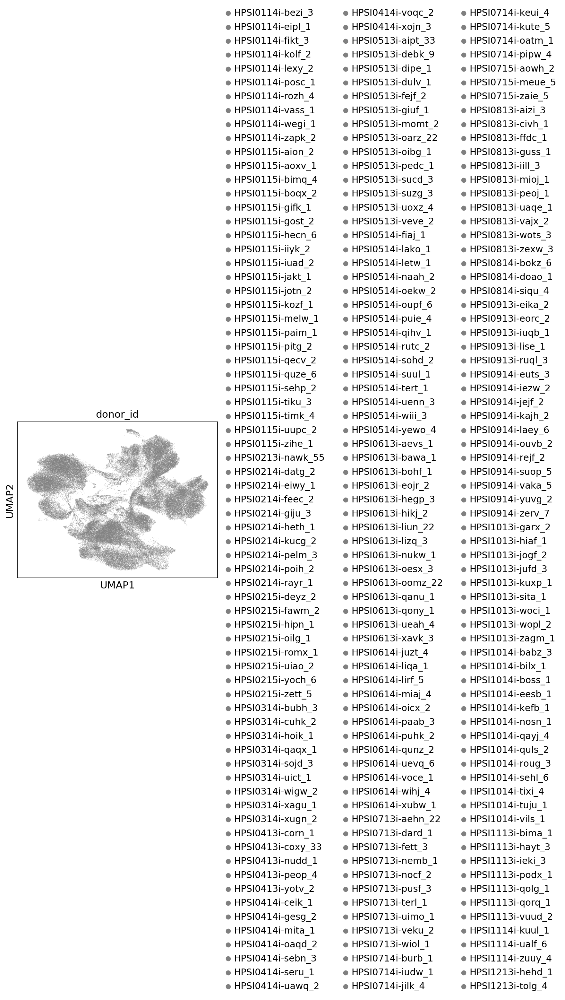

In [48]:
plotting_fcn(adata, color='donor_id')

In [49]:
for i in range(len(states)):
    adata.uns['donor_id_colors'][i] = 'lightgrey'
# adata.uns['donor_id_colors'][87] = '#17becf'
adata.uns['donor_id_colors'][191] = '#ffbb78'

In [52]:
dim_reduction = 'X_umap'
FS = 16

In [51]:
# neuron_cluster_list = ['pool1_13_noddd_D52_2','pool1_13_noddd_D52_3','pool1_13_noddd_D52_4','pool1_13_noddd_D52_11']
# other_cluster_list = ['pool1_13_noddd_D52_0','pool1_13_noddd_D52_1'] + ['pool1_13_noddd_D52_{}'.format(x) for x in range(5,11)]
time_point = 'D52'
cat_type = pd.CategoricalDtype(categories = adata.obs['donor_id'].cat.categories, ordered=True)
column = 'donor_id_{}'.format(time_point)
adata.obs[column] = (adata.obs
                         .apply(lambda x: x['donor_id'] if x['time_point']==time_point else 'other', axis=1)
                         .astype(cat_type))

In [52]:
donor1 = 'HPSI0514i-fiaj_1'
donor2 = 'HPSI1014i-eesb_1'
donor3 = 'HPSI1213i-hehd_1'

In [53]:
adata.obs['donor_id_D52']

index
ATCGAGTTCAAACGGG-1-60     HPSI0514i-fiaj_1
ACCAGTAAGACCTAGG-1-81                  NaN
GCTGCAGCAACCGCCA-1-46                  NaN
AACTCCCTCGACAGCC-1-66                  NaN
CGTCCATGTAGGCTGA-1-53     HPSI0115i-paim_1
                                ...       
TTCTTAGTCTTCGGTC-1-123                 NaN
TGAGGGAGTACCCAAT-1-79                  NaN
TCAGATGCATGACGGA-1-120    HPSI1113i-hayt_3
ACTTTCAAGACCGGAT-1-26                  NaN
TACACGAAGTGTCCCG-1-145    HPSI0114i-zapk_2
Name: donor_id_D52, Length: 205416, dtype: category
Categories (213, object): [HPSI0114i-bezi_3 < HPSI0114i-eipl_1 < HPSI0114i-fikt_3 < HPSI0114i-kolf_2 ... HPSI1114i-ualf_6 < HPSI1114i-zuuy_4 < HPSI1213i-hehd_1 < HPSI1213i-tolg_4]

Text(0, 0.5, 'UMAP2')

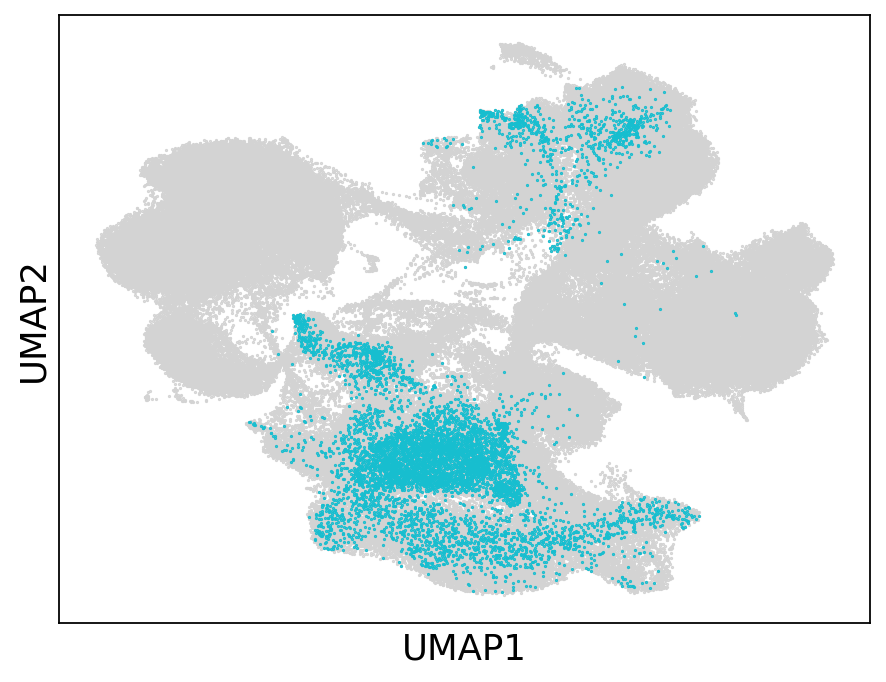

In [54]:
fig = figure(figsize=(6.5,5))
# # make dummy points for the colors for legend 
colors = ['lightcoral','tab:cyan','lightgrey']
for color in colors:
    scatter([],[], c = color, s=45.5)
scatter(adata.obsm[dim_reduction][:,0],adata.obsm[dim_reduction][:,1], c = 'lightgrey', s=0.2)
cells = (adata.obs['donor_id_D52']==donor1)
scatter(adata.obsm[dim_reduction][cells,0],adata.obsm[dim_reduction][cells,1], s=0.2, c ='#17becf')
# legend([''])
xticks([])
yticks([])
xlabel('UMAP1', fontsize=FS)
ylabel('UMAP2', fontsize=FS)

Text(0, 0.5, 'UMAP2')

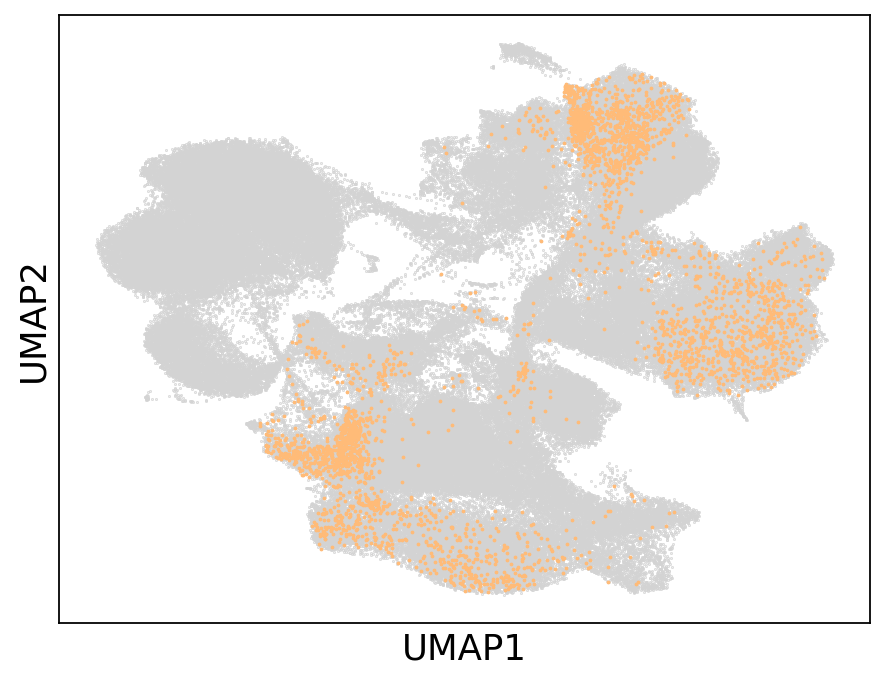

In [55]:
fig = figure(figsize=(6.5,5))
# # make dummy points for the colors for legend 
colors = ['lightcoral','tab:cyan','lightgrey']
for color in colors:
    scatter([],[], c = color, s=45.5)
scatter(adata.obsm[dim_reduction][:,0],adata.obsm[dim_reduction][:,1], c = 'lightgrey', s=0.1)
cells = (adata.obs['donor_id_D52']==donor2)
scatter(adata.obsm[dim_reduction][cells,0],adata.obsm[dim_reduction][cells,1], s=0.5, c='#ffbb78')
# legend([''])
xticks([])
yticks([])
xlabel('UMAP1', fontsize=FS)
ylabel('UMAP2', fontsize=FS)

Text(0, 0.5, 'UMAP2')

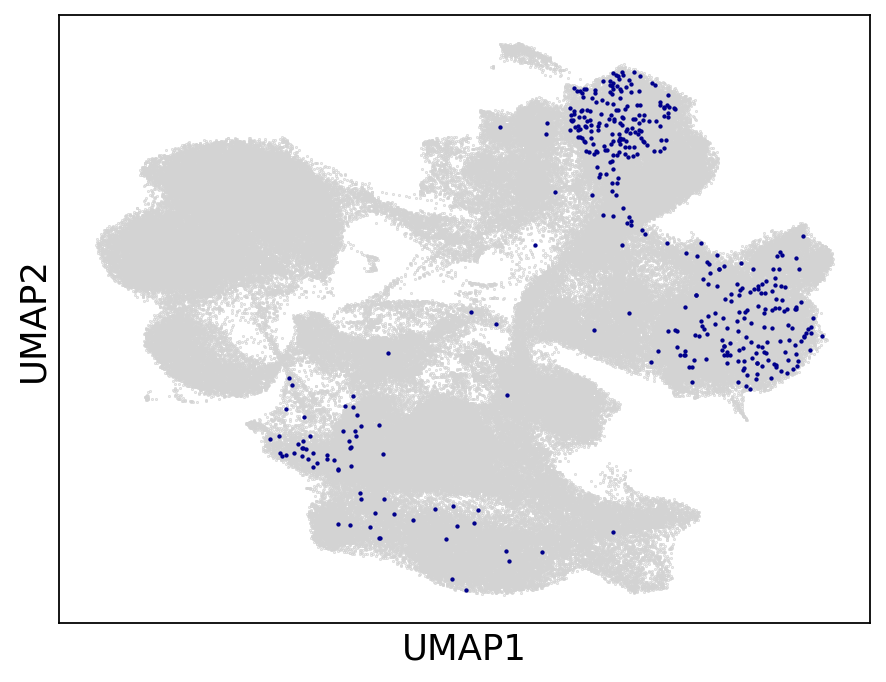

In [56]:
fig = figure(figsize=(6.5,5))
# # make dummy points for the colors for legend 
colors = ['lightcoral','tab:cyan','lightgrey']
for color in colors:
    scatter([],[], c = color, s=45.5)
scatter(adata.obsm[dim_reduction][:,0],adata.obsm[dim_reduction][:,1], c = 'lightgrey', s=0.1)
cells = (adata.obs['donor_id_D52']==donor3)
scatter(adata.obsm[dim_reduction][cells,0],adata.obsm[dim_reduction][cells,1], s=0.9, c='darkblue')
# legend([''])
xticks([])
yticks([])
xlabel('UMAP1', fontsize=FS)
ylabel('UMAP2', fontsize=FS)

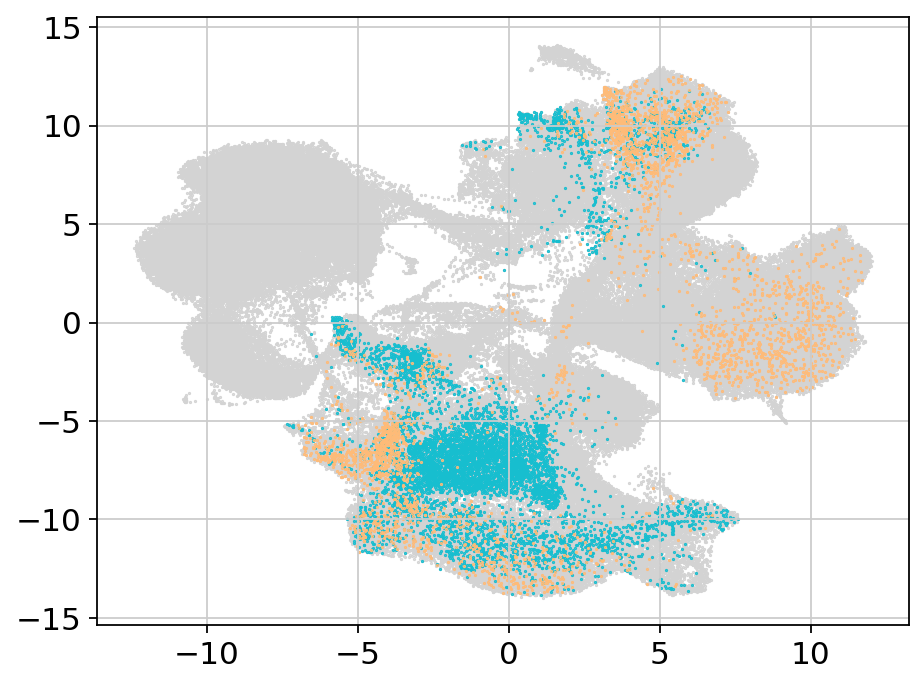

In [57]:
fig = figure(figsize=(6.5,5))
# # make dummy points for the colors for legend 
colors = ['lightcoral','tab:cyan','lightgrey']
for color in colors:
    scatter([],[], c = color, s=45.5)
scatter(adata.obsm[dim_reduction][:,0],adata.obsm[dim_reduction][:,1], c = 'lightgrey', s=0.2)
cells = (adata.obs['donor_id_D52']==donor1)
scatter(adata.obsm[dim_reduction][cells,0],adata.obsm[dim_reduction][cells,1], s=0.2, c ='#17becf')
cells = (adata.obs['donor_id_D52']==donor2)
scatter(adata.obsm[dim_reduction][cells,0],adata.obsm[dim_reduction][cells,1], s=0.2, c='#ffbb78')
# legend([''])
# xticks([])
# yticks([])
# xlabel('UMAP1', fontsize=FS)
# ylabel('UMAP2', fontsize=FS)

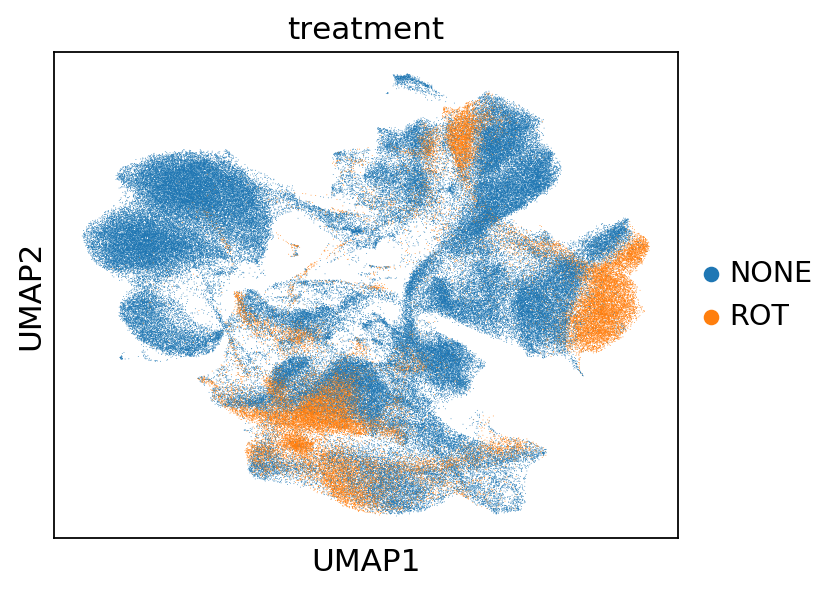

In [50]:
plotting_fcn(adata, color='treatment')

In [57]:
time_point = 'D52'
cat_type = pd.CategoricalDtype(categories = adata.obs['treatment'].cat.categories, ordered=True)
column = 'treatment_{}'.format(time_point)
adata.obs[column] = (adata.obs
                         .apply(lambda x: x['treatment'] if x['time_point']==time_point else 'other', axis=1)
                         .astype(cat_type))

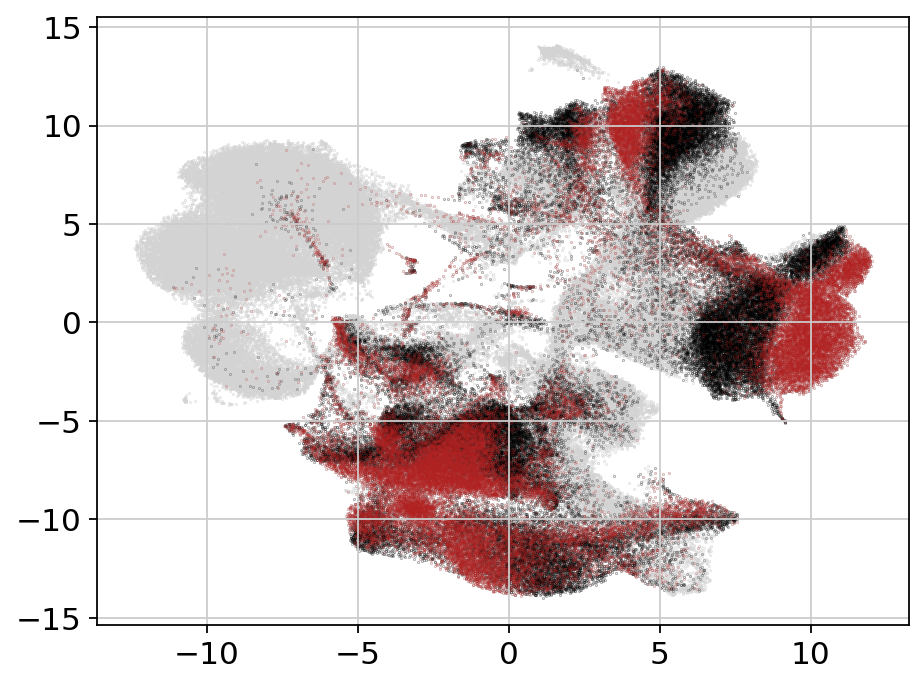

In [63]:
fig = figure(figsize=(6.5,5))
scatter(adata.obsm[dim_reduction][:,0],adata.obsm[dim_reduction][:,1], c = 'lightgrey', s=0.05)
cells = (adata.obs['treatment_D52']=='NONE')
scatter(adata.obsm[dim_reduction][cells,0],adata.obsm[dim_reduction][cells,1], s=0.01, c ='black')
cells = (adata.obs['treatment_D52']=='ROT')
scatter(adata.obsm[dim_reduction][cells,0],adata.obsm[dim_reduction][cells,1], s=0.01, c ='firebrick')

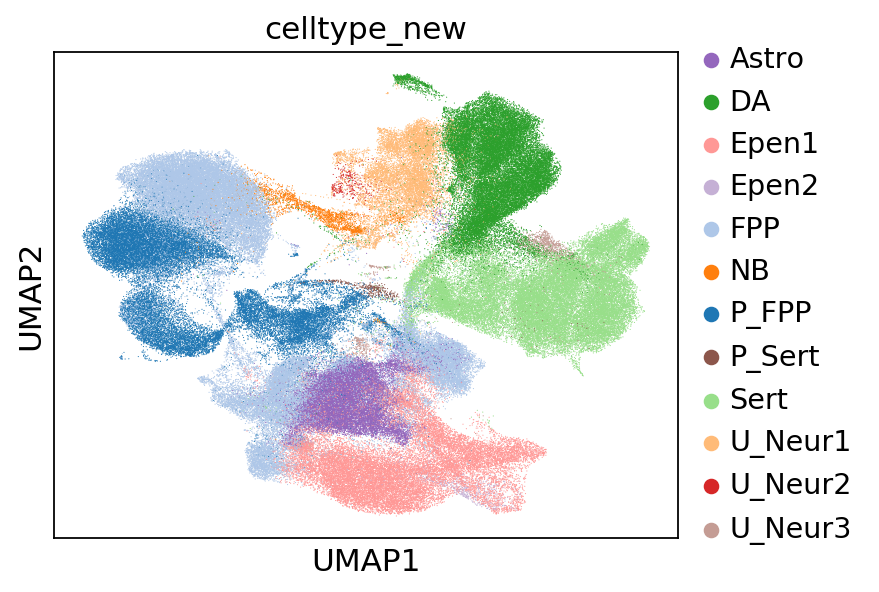

In [59]:
plotting_fcn(adata, color='celltype_new', size=1, palette=mypalette)

In [60]:
adata.uns['celltype_new_colors']

['#9467bd',
 '#2ca02c',
 '#ff9896',
 '#c5b0d5',
 '#aec7e8',
 '#ff7f0e',
 '#1f77b4',
 '#8c564b',
 '#98df8a',
 '#ffbb78',
 '#d62728',
 '#c49c94']

In [61]:
adata.obs['celltype_new'].cat.categories

Index(['Astro', 'DA', 'Epen1', 'Epen2', 'FPP', 'NB', 'P_FPP', 'P_Sert', 'Sert',
       'U_Neur1', 'U_Neur2', 'U_Neur3'],
      dtype='object')

In [62]:
col_prog = 'firebrick'
col_neurons = '#283655'
col_non_neurons = '#66a5ad'

adata.uns['celltype_new_colors'][0] = col_non_neurons
adata.uns['celltype_new_colors'][1] = col_neurons
adata.uns['celltype_new_colors'][2] = col_non_neurons
adata.uns['celltype_new_colors'][3] = col_non_neurons
adata.uns['celltype_new_colors'][4] = col_prog
adata.uns['celltype_new_colors'][5] = col_prog
adata.uns['celltype_new_colors'][6] = col_prog
adata.uns['celltype_new_colors'][7] = col_neurons
adata.uns['celltype_new_colors'][8] = col_neurons
adata.uns['celltype_new_colors'][9] = col_neurons
adata.uns['celltype_new_colors'][10] = col_neurons
adata.uns['celltype_new_colors'][11] = col_neurons

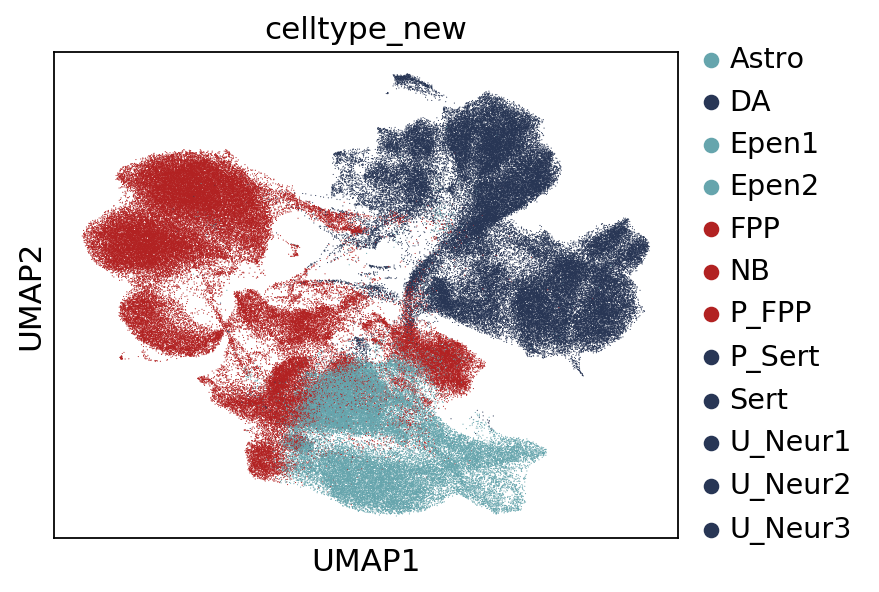

In [63]:
plotting_fcn(adata, color='celltype_new', size=1)

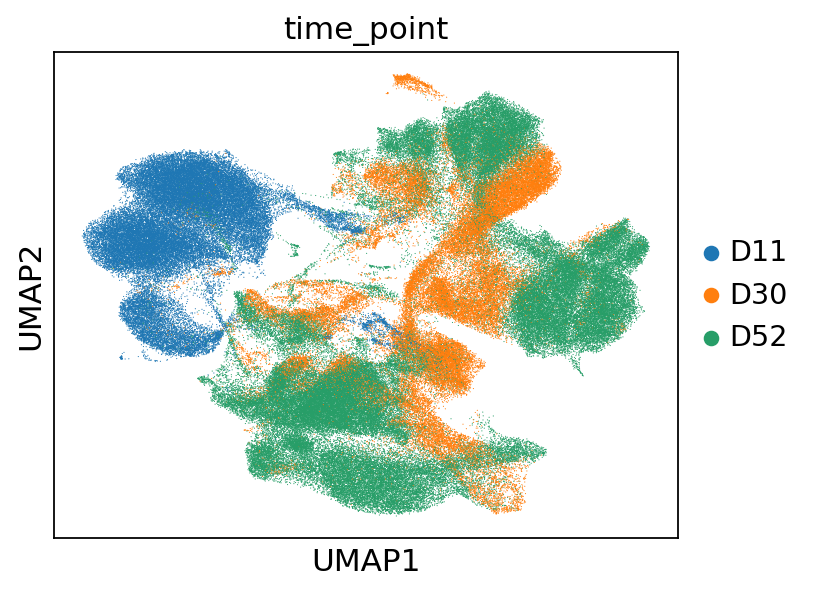

In [64]:
plotting_fcn(adata, color='time_point', size=1)

In [48]:
plotting_fcn(adata, color='treatment', size=1)

NameError: name 'plotting_fcn' is not defined

In [66]:
adata.obs['celltype_new'].unique()

[DA, FPP, P_FPP, Sert, NB, ..., Astro, U_Neur2, Epen2, U_Neur3, P_Sert]
Length: 12
Categories (12, object): [DA, FPP, P_FPP, Sert, ..., U_Neur2, Epen2, U_Neur3, P_Sert]

In [67]:
celltype_list = ['P_FPP','FPP','NB','DA','Sert','Astro','Epen1','P_Sert','Epen2','U_Neur1','U_Neur2','U_Neur3','other']
cat_type = pd.CategoricalDtype(categories = celltype_list, ordered=True)


for time_point in ['D11','D30','D52']:
    column = 'celltype_new_{}'.format(time_point)
    adata.obs[column] = (adata.obs
                         .apply(lambda x: x['celltype_new'] if x['time_point']==time_point else 'other', axis=1)
                         .astype(cat_type))


In [68]:
# adata.obs

In [69]:
# Astro:8, DA:4, Epen1:7, Epen2:9, FPP:1, NB:2, P_FPP:0, P_Sert:10, Sert:5, U_Neur1:3, U_Neur2:6, U_Neur3:11
palette = [vega_20[idx] for idx in range(len(celltype_list))]
myorder1 = [0,1,2,4,5,8,7,10,9,3,6,11,12]
mypalette1 = [palette[i] for i in myorder1]
mypalette1[-1] = 'lightgrey'

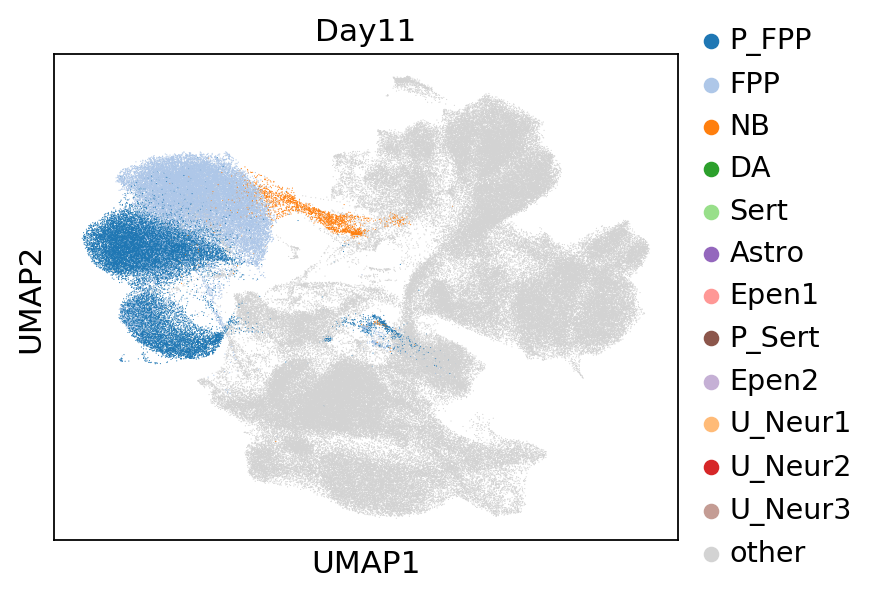

In [70]:
time_point = 'D11'
column = 'celltype_new_{}'.format(time_point)
plotting_fcn(adata, color=column, palette=mypalette1,title='Day11', size=1)

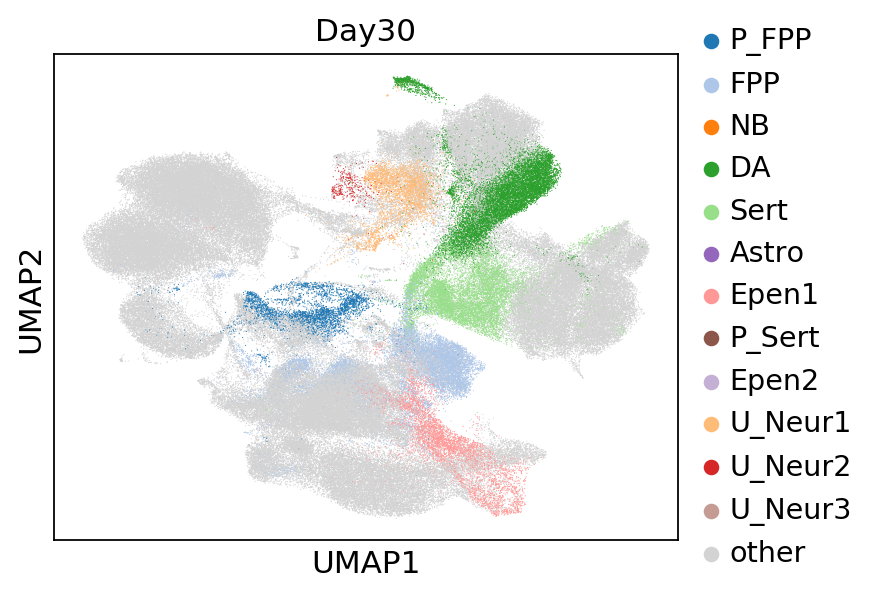

In [71]:
time_point = 'D30'
column = 'celltype_new_{}'.format(time_point)
plotting_fcn(adata, color=column, palette=mypalette1,title='Day30', size=1)

In [72]:
adata.obs['celltype_new_D52'].cat.categories

Index(['P_FPP', 'FPP', 'NB', 'DA', 'Sert', 'Astro', 'Epen1', 'P_Sert', 'Epen2',
       'U_Neur1', 'U_Neur2', 'U_Neur3', 'other'],
      dtype='object')

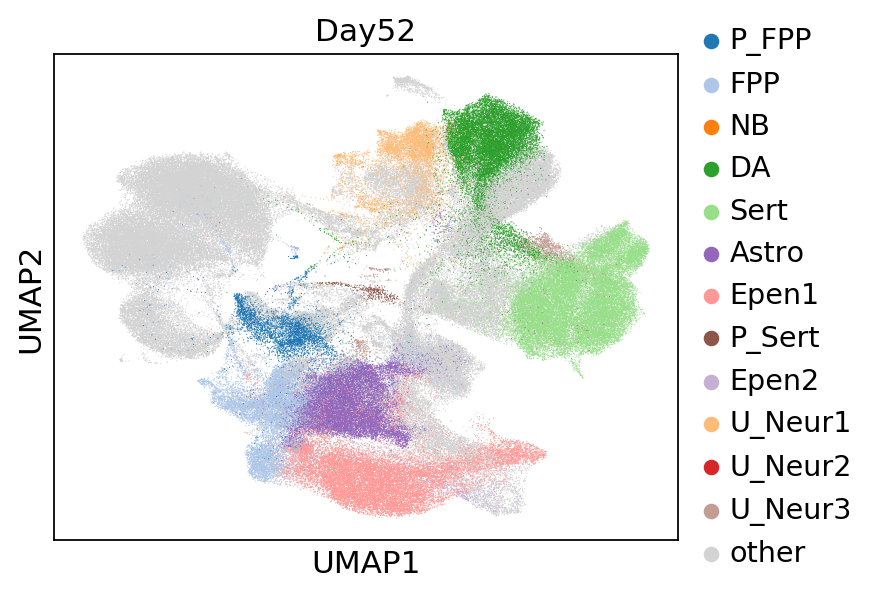

In [73]:
time_point = 'D52'
column = 'celltype_new_{}'.format(time_point)
plotting_fcn(adata, color=column, palette=mypalette1,title='Day52', size=1)

In [74]:
adata.uns['celltype_new_D52_colors']

['#1f77b4',
 '#aec7e8',
 '#ff7f0e',
 '#2ca02c',
 '#98df8a',
 '#9467bd',
 '#ff9896',
 '#8c564b',
 '#c5b0d5',
 '#ffbb78',
 '#d62728',
 '#c49c94',
 '#d3d3d3']

In [75]:
adata.obs['celltype_new_D52'].cat.categories

Index(['P_FPP', 'FPP', 'NB', 'DA', 'Sert', 'Astro', 'Epen1', 'P_Sert', 'Epen2',
       'U_Neur1', 'U_Neur2', 'U_Neur3', 'other'],
      dtype='object')

In [76]:
col = 'lightgrey'

adata.uns['celltype_new_D52_colors'][0] = col
adata.uns['celltype_new_D52_colors'][1] = col
adata.uns['celltype_new_D52_colors'][2] = col
# adata.uns['celltype_new_D52_colors'][3] = col
# adata.uns['celltype_new_D52_colors'][4] = col
adata.uns['celltype_new_D52_colors'][5] = col
adata.uns['celltype_new_D52_colors'][6] = col
adata.uns['celltype_new_D52_colors'][7] = col
adata.uns['celltype_new_D52_colors'][8] = col
adata.uns['celltype_new_D52_colors'][9] = col
adata.uns['celltype_new_D52_colors'][10] = col
adata.uns['celltype_new_D52_colors'][11] = col

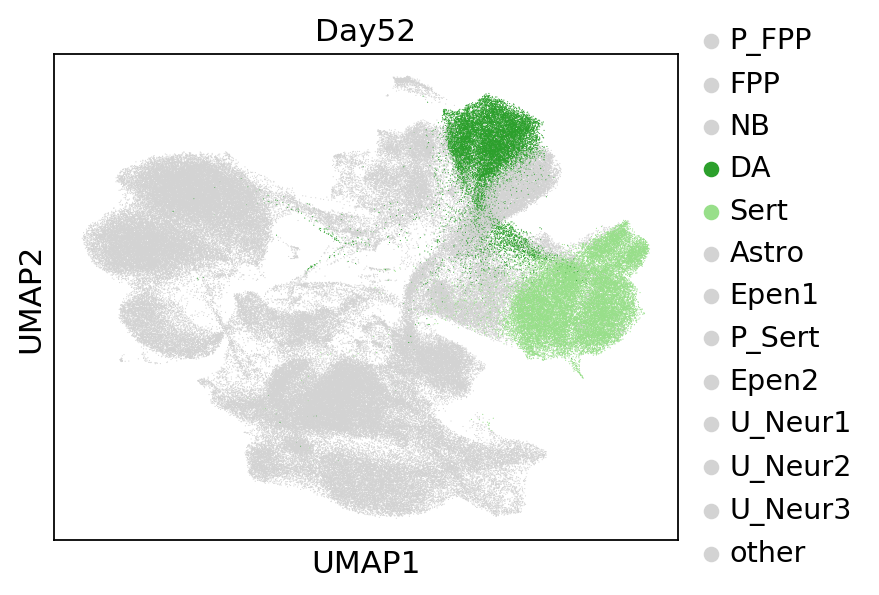

In [77]:
plotting_fcn(adata, color='celltype_new_D52', title='Day52', size=1)

In [78]:
for treatment in ['NONE','ROT']:
    column = 'celltype_new_D52_{}'.format(treatment)
    adata.obs[column] = (adata.obs
                         .apply(lambda x: x['celltype_new'] if x['time_point']=='D52' and x['treatment'] == treatment else 'other', axis=1)
                         .astype(cat_type))

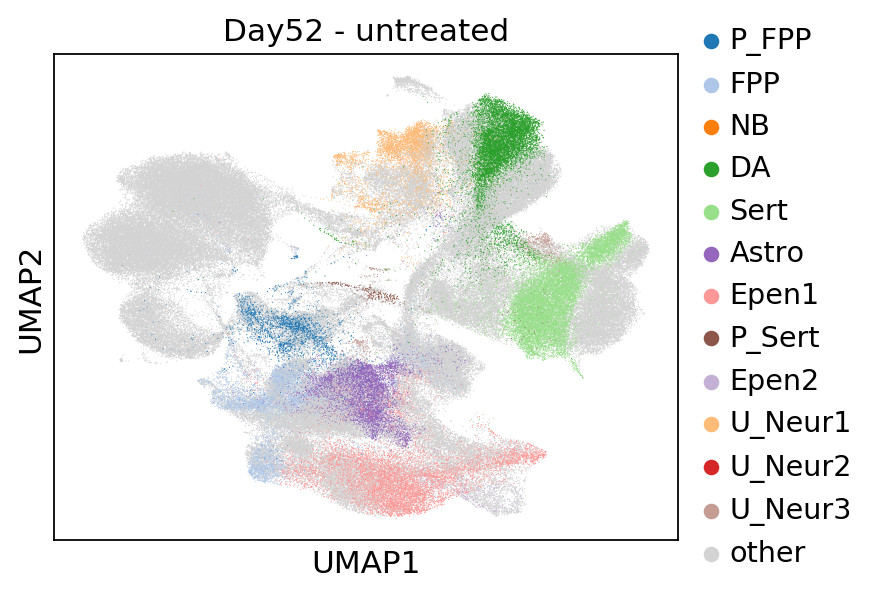

In [79]:
treatment = 'NONE'
column = 'celltype_new_D52_{}'.format(treatment)
plotting_fcn(adata, color=column, palette=mypalette1,title='Day52 - untreated', size=1)

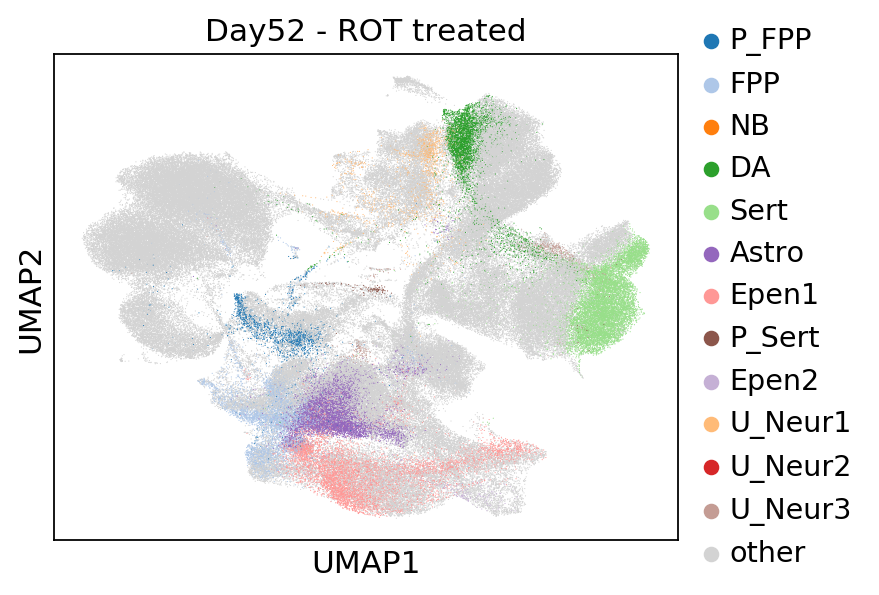

In [80]:
treatment = 'ROT'
column = 'celltype_new_D52_{}'.format(treatment)
plotting_fcn(adata, color=column, palette=mypalette1,title='Day52 - ROT treated', size=1)

In [ ]:
# from matplotlib import cm, colors

# vega_20 = list(map(colors.to_hex, cm.tab20.colors))

# # specify a color map, then turn this into a palette for each time_point
# # will depending on the order of the celltypes, I think.

# color_dict = dict()

# celltype_list = ['P_FPP','FPP','NB','CHem','DA','Sert','Astro','Epen1','P_Sert','Epen2','unknown','other']
# palette = [vega_20[idx] for idx in range(len(celltype_list))]
# palette[-1] = 'lightgrey'

In [ ]:
print(palette)
print(palette[6])
myorder = [0,1,2,3,5,11,4,6,7,8,9,10]
mypalette = [palette[i] for i in myorder]
# mypalette
print(mypalette)

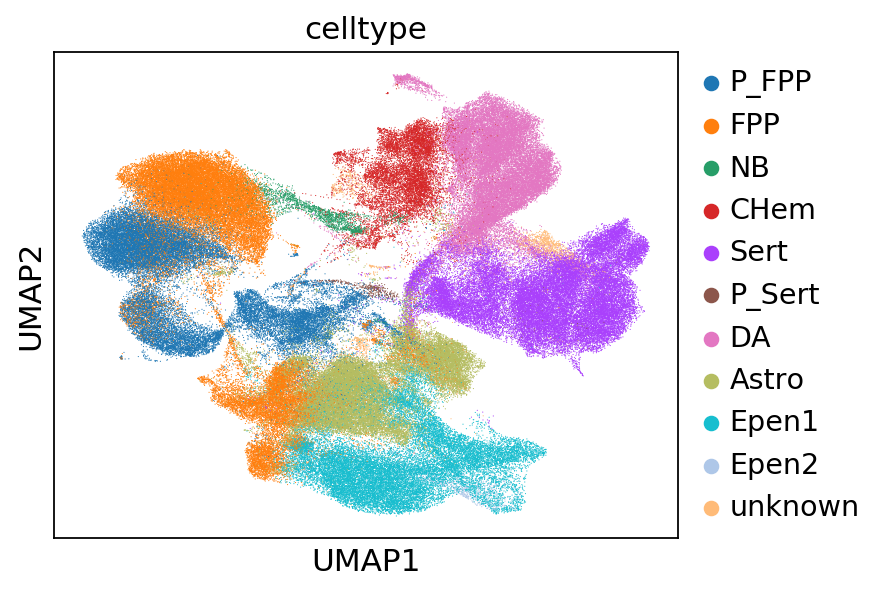

In [324]:
plotting_fcn(adata, color='celltype', size=1)

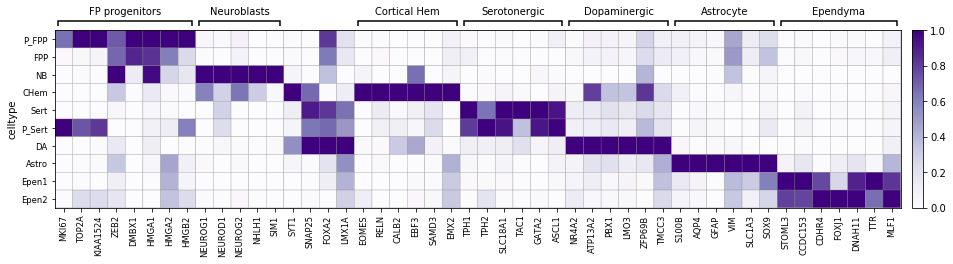

GridSpec(2, 3, height_ratios=[0.5, 10], width_ratios=[15.36, 0, 0.2])

In [21]:
var_group_positions=[(0,7), (8,12), (17, 22),(23,28), (29,34),(35,40),(41,47)]
var_group_labels=['FP progenitors','Neuroblasts', 'Cortical Hem','Serotonergic','Dopaminergic','Astrocyte','Ependyma']

excluded_celltypes = ['unknown','P_Sert',"Epen2"]
excluded_celltypes = ['unknown']

gene_list=['MKI67', 'TOP2A', 'KIAA1524', 'ZEB2', 'DMBX1', 'HMGA1', 'HMGA2', 'HMGB2',
           'NEUROG1', 'NEUROD1', 'NEUROG2', 'NHLH1', 'SIM1',
           'SYT1', 'SNAP25',
           'FOXA2', 'LMX1A',
           'EOMES', 'RELN','CALB2', 'EBF3', 'SAMD3', 'EMX2',
           'TPH1', 'TPH2', 'SLC18A1', 'TAC1', 'GATA2','ASCL1',
           'NR4A2', 'ATP13A2', 'PBX1', 'LMO3', 'ZFP69B', 'TMCC3',
           'S100B', 'AQP4', 'GFAP', 'VIM', 'SLC1A3','SOX9',
           'STOML3','CCDC153','CDHR4','FOXJ1','DNAH11','TTR','MLF1']

sc.pl.matrixplot(adata[~adata.obs['celltype'].isin(excluded_celltypes)], var_names=gene_list,
                 groupby='celltype', standard_scale='var', cmap='Purples',
                 var_group_positions=var_group_positions, var_group_labels = var_group_labels,
                 var_group_rotation=0)

<Figure size 432x288 with 0 Axes>

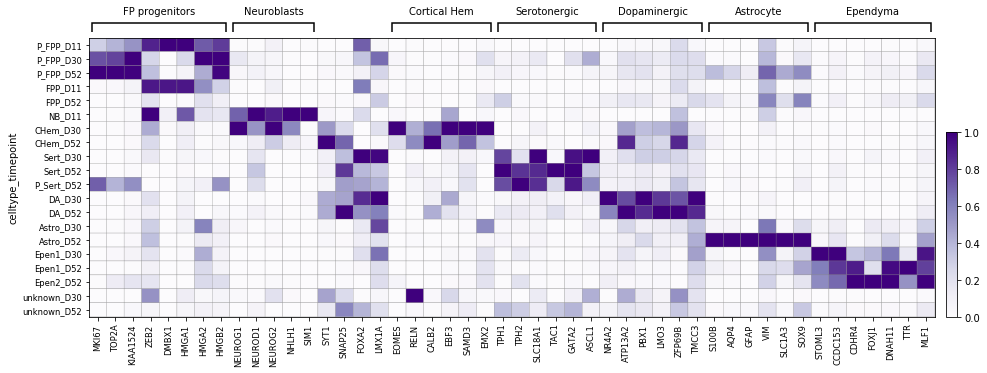

<Figure size 432x288 with 0 Axes>

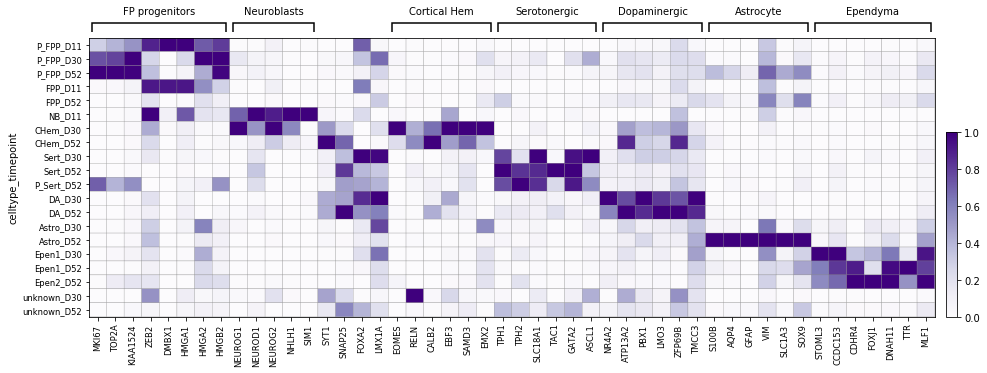

<Figure size 432x288 with 0 Axes>

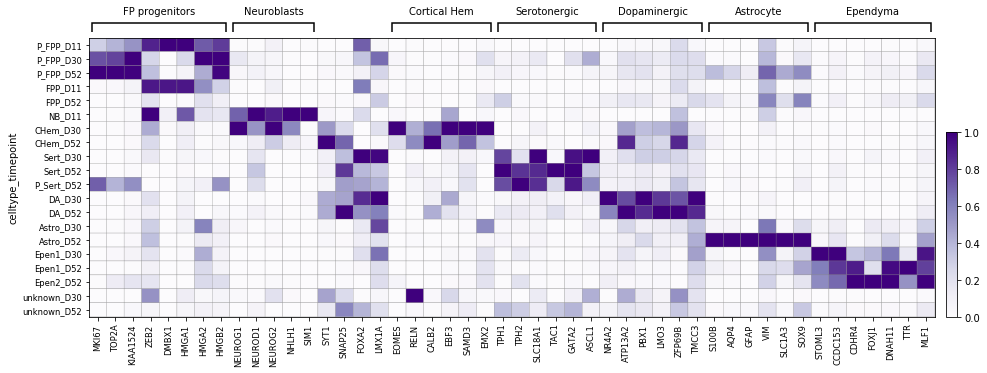

In [23]:
adata.obs['celltype_timepoint'] = (adata.obs.apply(lambda x: x['celltype']+'_'+x['time_point'], axis=1))

# select combinations with any cells
selected = list(adata.obs['celltype_timepoint'].value_counts()[adata.obs['celltype_timepoint'].value_counts()>50].index)


# try to store celltype as categorical with different ordering
ordering = ["P_FPP","FPP","NB","CHem","Sert","P_Sert","DA", "Astro","Epen1","Epen2","unknown"]
ordering = [x+'_'+y for x in ordering for y in ['D11','D30','D52']]

# filter down to those with any cells
ordering = [x for x in ordering if x in selected]

cat_type = pd.CategoricalDtype(categories=ordering,ordered=True)

adata.obs['celltype_timepoint'] = adata.obs['celltype_timepoint'].astype(cat_type)

var_group_positions=[(0,7), (8,12), (17, 22),(23,28), (29,34),(35,40),(41,47)]
var_group_labels=['FP progenitors','Neuroblasts', 'Cortical Hem','Serotonergic','Dopaminergic','Astrocyte','Ependyma']

#excluded_celltypes = ['unknown','P_Sert',"Epen2"]
#excluded_celltypes = ['unknown']

gene_list=['MKI67', 'TOP2A', 'KIAA1524', 'ZEB2', 'DMBX1', 'HMGA1', 'HMGA2', 'HMGB2',
           'NEUROG1', 'NEUROD1', 'NEUROG2', 'NHLH1', 'SIM1',
           'SYT1', 'SNAP25',
           'FOXA2', 'LMX1A',
           'EOMES', 'RELN','CALB2', 'EBF3', 'SAMD3', 'EMX2',
           'TPH1', 'TPH2', 'SLC18A1', 'TAC1', 'GATA2','ASCL1',
           'NR4A2', 'ATP13A2', 'PBX1', 'LMO3', 'ZFP69B', 'TMCC3',
           'S100B', 'AQP4', 'GFAP', 'VIM', 'SLC1A3','SOX9',
           'STOML3','CCDC153','CDHR4','FOXJ1','DNAH11','TTR','MLF1']

for time_point in ['D11','D30','D52']:
    figure()
    sc.pl.matrixplot(adata, var_names=gene_list,
                     groupby='celltype_timepoint', standard_scale='var', cmap='Purples',
                     var_group_positions=var_group_positions, var_group_labels = var_group_labels,
                     var_group_rotation=0)

/nfs/software/stegle/users/acuomo/conda-envs/myscanpy/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


<Figure size 432x288 with 0 Axes>

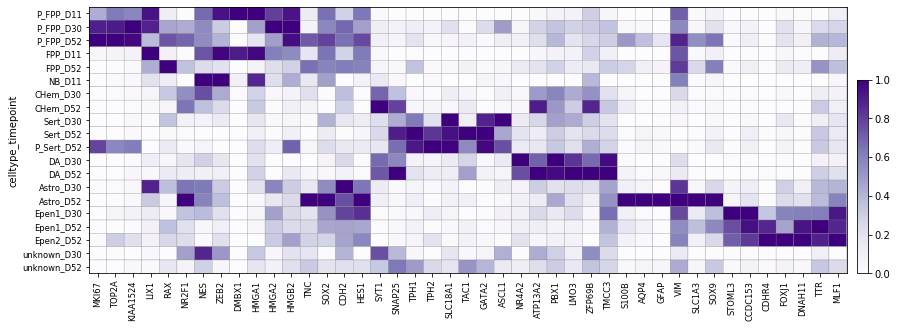

<Figure size 432x288 with 0 Axes>

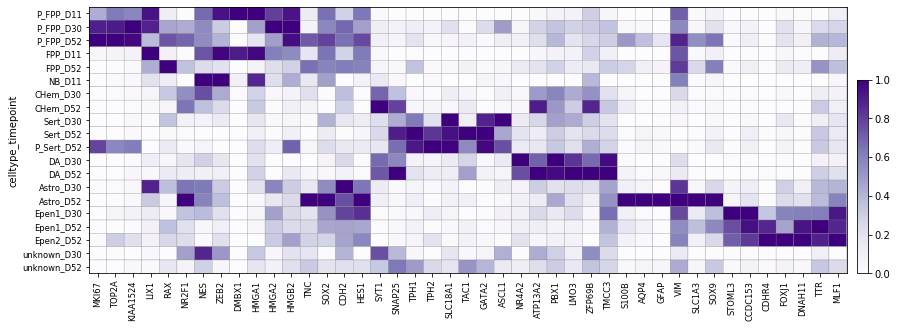

<Figure size 432x288 with 0 Axes>

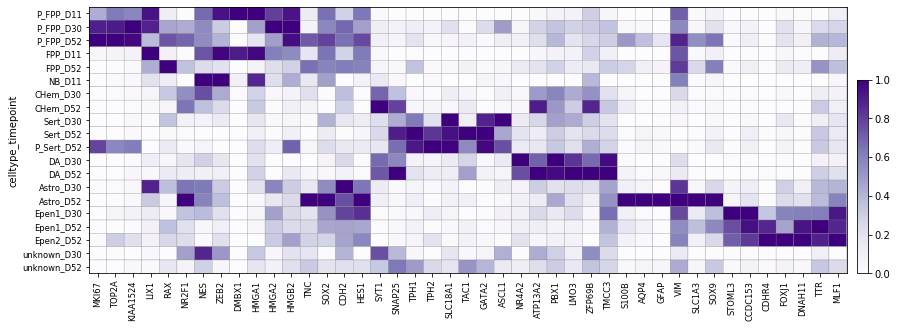

In [116]:
adata.obs['celltype_timepoint'] = (adata.obs.apply(lambda x: x['celltype']+'_'+x['time_point'], axis=1))

adata.obs['celltype_timepoint']['Astro_D30'] = 'GP_D30'

# select combinations with any cells
selected = list(adata.obs['celltype_timepoint'].value_counts()[adata.obs['celltype_timepoint'].value_counts()>50].index)


# try to store celltype as categorical with different ordering
ordering = ["P_FPP","FPP","GP","NB","CHem","Sert","P_Sert","DA", "Astro","Epen1","Epen2","unknown"]
ordering = [x+'_'+y for x in ordering for y in ['D11','D30','D52']]

# filter down to those with any cells
ordering = [x for x in ordering if x in selected]

cat_type = pd.CategoricalDtype(categories=ordering,ordered=True)

adata.obs['celltype_timepoint'] = adata.obs['celltype_timepoint'].astype(cat_type)

# var_group_positions=[(0,7), (8,12), (17, 22),(23,28), (29,34),(35,40),(41,47)]
# var_group_labels=['FP progenitors','Neuroblasts', 'Cortical Hem','Serotonergic','Dopaminergic','Astrocyte','Ependyma']

#excluded_celltypes = ['unknown','P_Sert',"Epen2"]
#excluded_celltypes = ['unknown']

gene_list=['MKI67','TOP2A', 'KIAA1524','LIX1','RAX', 'NR2F1','NES', 'ZEB2','DMBX1','HMGA1','HMGA2','HMGB2',
           'TNC','SOX2','CDH2','HES1', 'SYT1', 'SNAP25','TPH1', 'TPH2', 'SLC18A1', 'TAC1', 'GATA2','ASCL1',
           'NR4A2', 'ATP13A2', 'PBX1', 'LMO3', 'ZFP69B', 'TMCC3','S100B', 'AQP4', 'GFAP', 'VIM', 'SLC1A3','SOX9',
           'STOML3','CCDC153','CDHR4','FOXJ1','DNAH11','TTR','MLF1']

for time_point in ['D11','D30','D52']:
    figure()
    sc.pl.matrixplot(adata, var_names=gene_list,
                     groupby='celltype_timepoint', standard_scale='var', cmap='Purples',
#                      var_group_positions=var_group_positions, var_group_labels = var_group_labels,
                     var_group_rotation=0)

<Figure size 432x288 with 0 Axes>

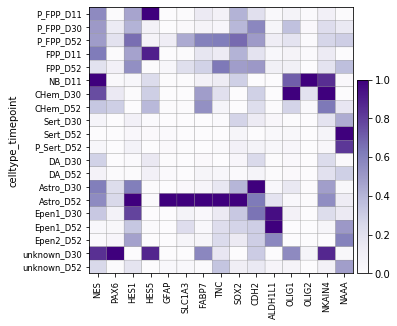

<Figure size 432x288 with 0 Axes>

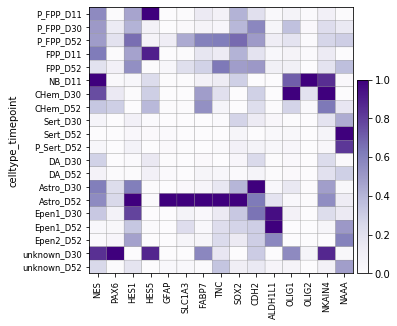

<Figure size 432x288 with 0 Axes>

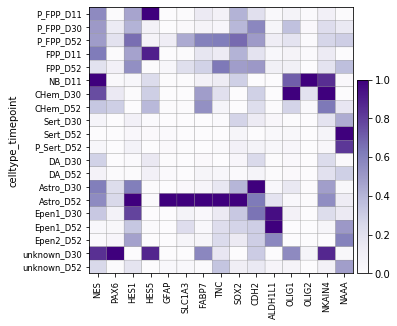

In [25]:
adata.obs['celltype_timepoint'] = (adata.obs.apply(lambda x: x['celltype']+'_'+x['time_point'], axis=1))

# select combinations with any cells
selected = list(adata.obs['celltype_timepoint'].value_counts()[adata.obs['celltype_timepoint'].value_counts()>50].index)


# try to store celltype as categorical with different ordering
ordering = ["P_FPP","FPP","NB","CHem","Sert","P_Sert","DA", "Astro","Epen1","Epen2","unknown"]
ordering = [x+'_'+y for x in ordering for y in ['D11','D30','D52']]

# filter down to those with any cells
ordering = [x for x in ordering if x in selected]

cat_type = pd.CategoricalDtype(categories=ordering,ordered=True)

adata.obs['celltype_timepoint'] = adata.obs['celltype_timepoint'].astype(cat_type)

# var_group_positions=[(0,7), (8,12), (17, 22),(23,28), (29,34),(35,40),(41,47)]
# var_group_labels=['FP progenitors','Neuroblasts', 'Cortical Hem','Serotonergic','Dopaminergic','Astrocyte','Ependyma']

#excluded_celltypes = ['unknown','P_Sert',"Epen2"]
#excluded_celltypes = ['unknown']

gene_list=['NES','PAX6','HES1','HES5','GFAP','SLC1A3','FABP7','TNC','SOX2','CDH2','ALDH1L1',
       'OLIG1','OLIG2','NKAIN4','NAAA']

for time_point in ['D11','D30','D52']:
    figure()
    sc.pl.matrixplot(adata, var_names=gene_list,
                     groupby='celltype_timepoint', standard_scale='var', cmap='Purples',
                    # var_group_positions=var_group_positions, var_group_labels = var_group_labels,
                     var_group_rotation=0)

<Figure size 432x288 with 0 Axes>

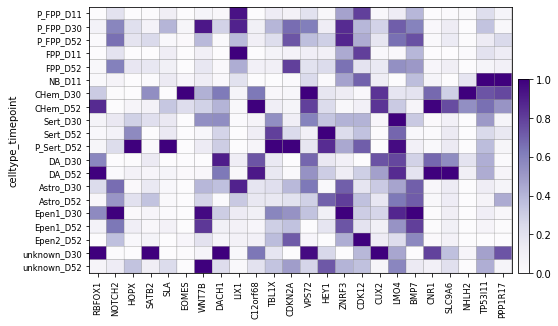

<Figure size 432x288 with 0 Axes>

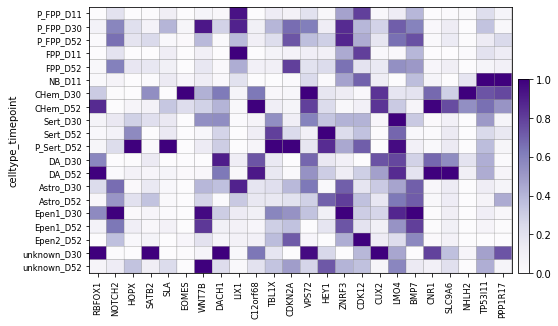

<Figure size 432x288 with 0 Axes>

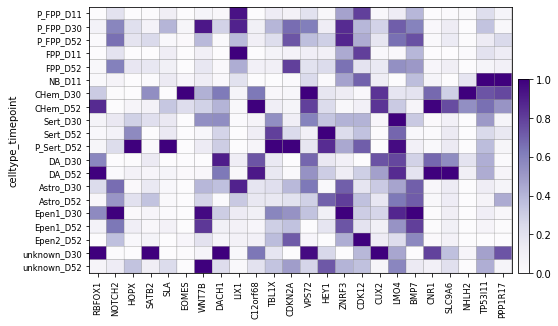

In [90]:
adata.obs['celltype_timepoint'] = (adata.obs.apply(lambda x: x['celltype']+'_'+x['time_point'], axis=1))

# select combinations with any cells
selected = list(adata.obs['celltype_timepoint'].value_counts()[adata.obs['celltype_timepoint'].value_counts()>50].index)


# try to store celltype as categorical with different ordering
ordering = ["P_FPP","FPP","NB","CHem","Sert","P_Sert","DA", "Astro","Epen1","Epen2","unknown"]
ordering = [x+'_'+y for x in ordering for y in ['D11','D30','D52']]

# filter down to those with any cells
ordering = [x for x in ordering if x in selected]

cat_type = pd.CategoricalDtype(categories=ordering,ordered=True)

adata.obs['celltype_timepoint'] = adata.obs['celltype_timepoint'].astype(cat_type)

# var_group_positions=[(0,7), (8,12), (17, 22),(23,28), (29,34),(35,40),(41,47)]
# var_group_labels=['FP progenitors','Neuroblasts', 'Cortical Hem','Serotonergic','Dopaminergic','Astrocyte','Ependyma']

#excluded_celltypes = ['unknown','P_Sert',"Epen2"]
#excluded_celltypes = ['unknown']
gene_list=['RBFOX1','NOTCH2','HOPX','SATB2','SLA', 'EOMES','WNT7B','DACH1','LIX1',
#            'CCDC184',
           'C12orf68',
           'TBL1X', 'CDKN2A','VPS72',
#            'CCDN1',
#            'TCFL1', 
          'HEY1','ZNRF3','CDK12','CUX2','LMO4','BMP7','CNR1','SLC9A6',
#            'LGAGS1',
           'NHLH2','TP53I11','PPP1R17']

for time_point in ['D11','D30','D52']:
    figure()
    sc.pl.matrixplot(adata, var_names=gene_list,
                     groupby='celltype_timepoint', standard_scale='var', cmap='Purples',
                    # var_group_positions=var_group_positions, var_group_labels = var_group_labels,
                     var_group_rotation=0)

<Figure size 432x288 with 0 Axes>

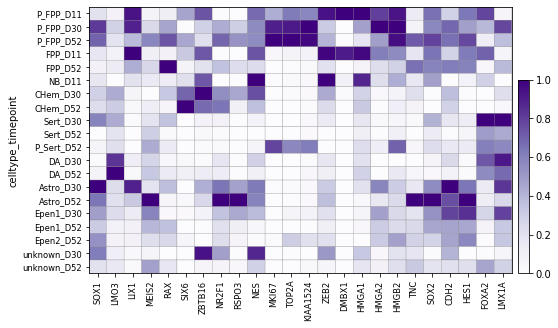

<Figure size 432x288 with 0 Axes>

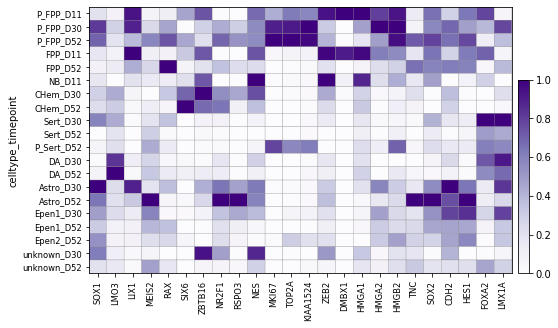

<Figure size 432x288 with 0 Axes>

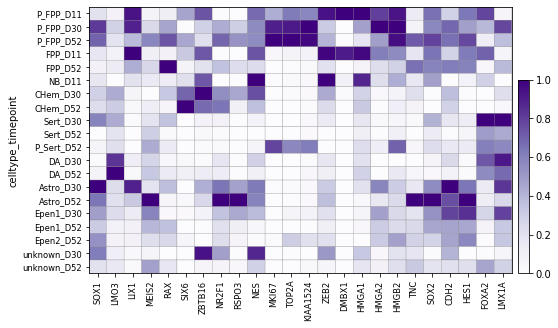

In [102]:
adata.obs['celltype_timepoint'] = (adata.obs.apply(lambda x: x['celltype']+'_'+x['time_point'], axis=1))

# select combinations with any cells
selected = list(adata.obs['celltype_timepoint'].value_counts()[adata.obs['celltype_timepoint'].value_counts()>50].index)


# try to store celltype as categorical with different ordering
ordering = ["P_FPP","FPP","NB","CHem","Sert","P_Sert","DA", "Astro","Epen1","Epen2","unknown"]
ordering = [x+'_'+y for x in ordering for y in ['D11','D30','D52']]

# filter down to those with any cells
ordering = [x for x in ordering if x in selected]

cat_type = pd.CategoricalDtype(categories=ordering,ordered=True)

adata.obs['celltype_timepoint'] = adata.obs['celltype_timepoint'].astype(cat_type)

# var_group_positions=[(0,7), (8,12), (17, 22),(23,28), (29,34),(35,40),(41,47)]
# var_group_labels=['FP progenitors','Neuroblasts', 'Cortical Hem','Serotonergic','Dopaminergic','Astrocyte','Ependyma']

#excluded_celltypes = ['unknown','P_Sert',"Epen2"]
#excluded_celltypes = ['unknown']
gene_list=['SOX1','LMO3', 'LIX1','MEIS2', 'RAX', 'SIX6', 
#            'NCAD', 
           'ZBTB16', 'NR2F1', 'RSPO3', 'NES', 'MKI67', 'TOP2A', 
           'KIAA1524', 'ZEB2', 'DMBX1', 'HMGA1', 'HMGA2', 'HMGB2', 'TNC', 'SOX2','CDH2', 'HES1','FOXA2', 'LMX1A']

for time_point in ['D11','D30','D52']:
    figure()
    sc.pl.matrixplot(adata, var_names=gene_list,
                     groupby='celltype_timepoint', standard_scale='var', cmap='Purples',
                    # var_group_positions=var_group_positions, var_group_labels = var_group_labels,
                     var_group_rotation=0)

In [ ]:
import pandas as pd
eqtl = pd.read_csv("/hps/nobackup/stegle/users/acuomo/all_scripts/sc_neuroseq/eqtl/all_leads_5pct_FDR.csv")
eqtl.head()

eqtl[eqtl['feature_id'] == 'ENSG00000168116']

In [ ]:
parser = argparse.ArgumentParser()
parser.add_argument('--h5_input',
                    help="Input h5 file", type=str)
parser.add_argument('--pca_input',
                    help="Input dimensionality reduction file", type=str)
parser.add_argument('--h5_output',
                    help="Output results file", type=str)
parser.add_argument('--cluster_output',
                    help="Output cluster tsv file", type=str)
parser.add_argument('--resolution',
                    help="Louvain clustering resolution - higher values create smaller clusters.",
                    default=0.15, type=float)
args = parser.parse_args()

in_file = args.h5_input
pca_file = args.pca_input
dataset_outfile = args.h5_output
cluster_outfile = args.cluster_output
resolution = args.resolution

import argparse
import pandas as pd
import scanpy.api as sc


parser = argparse.ArgumentParser()
parser.add_argument('--h5_input',
                    help="Input h5 file", type=str)
parser.add_argument('--pca_input',
                    help="Input dimensionality reduction file", type=str)
parser.add_argument('--h5_output',
                    help="Output results file", type=str)
parser.add_argument('--cluster_output',
                    help="Output cluster tsv file", type=str)
parser.add_argument('--resolution',
                    help="Louvain clustering resolution - higher values create smaller clusters.",
                    default=0.15, type=float)
args = parser.parse_args()

in_file = args.h5_input
pca_file = args.pca_input
dataset_outfile = args.h5_output
cluster_outfile = args.cluster_output
resolution = args.resolution

pca_df = pd.read_csv(pca_file, sep='\t', index_col=0)

adata = sc.read(in_file)

# replace PCA with the specified PCA
adata.obsm['X_pca'] = pca_df.values

print('clustering...')

sc.pp.neighbors(adata, n_neighbors=10)

sc.tl.louvain(adata, flavor='vtraag',resolution=resolution)

print('{} clusters identified'.format(adata.obs['louvain'].drop_duplicates().shape[0]))

print('computing UMAP...')
sc.tl.umap(adata, random_state=2)

adata.write(dataset_outfile)

cell_clustering_df = adata.obs[['louvain']]
cell_clustering_df.to_csv(cluster_outfile, sep='\t')

dplyr        (0.8.3       -> 0.8.4      ) [CRAN]
tidyr        (0.8.3       -> 1.0.2      ) [CRAN]
rlang        (0.4.0       -> 0.4.4      ) [CRAN]
RcppArmad... (0.9.800.3.0 -> 0.9.850.1.0) [CRAN]
RcppProgress (0.4.1       -> 0.4.2      ) [CRAN]
pkgconfig    (2.0.2       -> 2.0.3      ) [CRAN]
R6           (2.4.0       -> 2.4.1      ) [CRAN]
tidyselect   (0.2.5       -> 1.0.0      ) [CRAN]
BH           (1.69.0-1    -> 1.72.0-3   ) [CRAN]
scales       (1.0.0       -> 1.1.0      ) [CRAN]
stringi      (1.4.3       -> 1.4.5      ) [CRAN]
vctrs        (0.2.0       -> 0.2.2      ) [CRAN]
digest       (0.6.20      -> 0.6.23     ) [CRAN]
cli          (1.1.0       -> 2.0.1      ) [CRAN]
fansi        (0.4.0       -> 0.4.1      ) [CRAN]
pillar       (1.4.2       -> 1.4.3      ) [CRAN]
plyr         (1.8.4       -> 1.8.5      ) [CRAN]
farver       (NA          -> 2.0.3      ) [CRAN]


Installing 18 packages: dplyr, tidyr, rlang, RcppArmadillo, RcppProgress, pkgconfig, R6, tidyselect, BH, scales, stringi, vctrs, digest, cli, fansi, pillar, plyr, farver
